# **Analysis of the COVID-19 Variants Dataset (surv_variants.csv)**

## **Project Components: Step-by-Step Analysis of the Dataset: Surv_variants**

## 1. **Load and Inspect the Data**

In [133]:
# Import necessary libraries
import pandas as pd
import numpy as np
from scipy import stats
import matplotlib.pyplot as plt
import plotly.express as px
import seaborn as sns
# Using my GitHub URL for the surve_variants dataset 
# Load the dataset
url = "https://raw.githubusercontent.com/Electricalelectronicsfinland/Analysis-of-the-COVID-19-Variants-Dataset-/refs/heads/main/surv_variants.csv"
df = pd.read_csv(url)
print(df.head())
print(df.info())

     Country   first_seq  num_seqs    last_seq variant censure_date  duration  \
0      China  2019-10-22         3  2020-06-03  S.Q677   2020-06-21       225   
1        USA  2020-03-03     26022  2021-11-19  S.Q677   2020-11-01       626   
2     Brazil  2020-03-09      1553  2021-11-12  S.Q677   2020-11-07       613   
3  Australia  2020-03-20        88  2021-11-14  S.Q677   2020-11-18       604   
4     Sweden  2020-03-20       810  2021-11-19  S.Q677   2020-11-18       609   

   censored  mortality_rate    total_cases  total_deaths   growth_rate  
0      True        0.052983   18259.460123    967.435583  16447.430706  
1     False        0.016111  256577.596234   4133.841031  84748.745876  
2     False        0.027846  101550.140466   2827.764288  42356.907426  
3     False        0.009905    1402.239579     13.889752   1227.122500  
4     False        0.012711    1659.148728     21.089425   2521.042925  
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4113 entries, 0 to 4112
D

## **2. Clean and Prepare Data**

In [134]:
# Convert date columns to datetime format:
date_cols = ['first_seq', 'last_seq', 'censure_date']
df[date_cols] = df[date_cols].apply(pd.to_datetime)

## **3. Basic Descriptive Statistics**

In [135]:
# Numeric column summaries
print(df.describe())

# Variant distribution
print(df['variant'].value_counts())

# Country coverage
print(df['Country'].nunique())

                           first_seq      num_seqs  \
count                           4113  4.113000e+03   
mean   2021-01-22 06:45:04.595185920  4.216428e+03   
min              2019-10-22 00:00:00  1.000000e+00   
25%              2020-11-18 00:00:00  4.000000e+00   
50%              2021-01-25 00:00:00  3.000000e+01   
75%              2021-04-22 00:00:00  2.700000e+02   
max              2021-11-28 00:00:00  1.289311e+06   
std                              NaN  3.971929e+04   

                            last_seq                   censure_date  \
count                           4113                           4113   
mean   2021-07-23 20:00:52.516411392  2021-09-22 06:45:04.595185920   
min              2020-03-03 00:00:00            2020-06-21 00:00:00   
25%              2021-05-20 00:00:00            2021-07-19 00:00:00   
50%              2021-08-07 00:00:00            2021-09-25 00:00:00   
75%              2021-10-24 00:00:00            2021-12-21 00:00:00   
max             

## **4. Temporal Analysis**

In [136]:
# Timeline of variant emergence
print(df.groupby('variant')['first_seq'].min().sort_values())

# Duration analysis
print(df['duration'].describe())

variant
DanishCluster          2019-10-22
S.K417                 2019-10-22
S.L18                  2019-10-22
S.P681                 2019-10-22
S.E484                 2019-10-22
S.Q677                 2019-10-22
S.Q613                 2019-10-22
S.Q677H.Yellowhammer   2019-10-22
S.T572                 2019-10-22
S.Q677H.Mockingbird    2019-10-22
S.A222                 2019-10-22
S.H69-                 2020-01-05
S.H655                 2020-01-23
S.Y144-                2020-01-27
S.S477                 2020-02-02
20A.S.210T             2020-03-10
ORF1a.S3675            2020-03-10
S.Y145                 2020-03-13
S.N501                 2020-03-19
S.N439K                2020-04-03
S.Y453F                2020-04-25
20A.EU1                2020-04-30
S.Q677H.Quail          2020-05-17
S.Q677H.Bluebird       2020-06-10
S.S98F                 2020-06-12
S.V1122L               2020-07-06
20A.EU2                2020-07-09
S.A626S                2020-07-12
S.D80Y                 2020-07-16
S.Q677

## **5. Mortality Analysis**

In [137]:
# Highest mortality variants
print(df.sort_values('mortality_rate', ascending=False)[['variant', 'Country', 'mortality_rate']].head(10))

# Mortality by variant type
print(df.groupby('variant')['mortality_rate'].mean().sort_values(ascending=False))

               variant      Country  mortality_rate
2279  S.Q677H.Bluebird           UK        0.145330
598            S.A626S       France        0.124631
477            S.Y453F  Netherlands        0.104193
1613            S.D80Y      Belgium        0.097717
2241         21B.Kappa       Mexico        0.094122
2289  S.Q677H.Bluebird       Mexico        0.093877
1625     S.Q677H.Quail       Mexico        0.093877
2363      20I.Alpha.V1         Peru        0.093724
3168            S.S477         Peru        0.093192
608            S.A626S      Belgium        0.093173
variant
S.Q677H.Quail           0.035127
S.Q677H.Bluebird        0.032989
S.Q677H.Robin2          0.030850
S.Y453F                 0.029526
S.A626S                 0.027306
S.Q677P.Pelican         0.027028
S.D80Y                  0.026922
S.Q677H.Robin1          0.026464
S.Q677H.Yellowhammer    0.025056
21G.Lambda              0.023464
S.Q677H.Mockingbird     0.022965
21H.Mu                  0.022511
21F.Iota                

## **6. Growth Rate Analysis**

In [138]:
# Fastest growing variants
print(df.sort_values('growth_rate', ascending=False)[['variant', 'Country', 'growth_rate']].head(10))

               variant Country    growth_rate
1462       21K.Omicron      UK  600412.400000
1207  Delta.ORF1a3059F      UK  490386.351246
1162        Delta.299I      UK  489323.371172
761         Delta.250I      UK  484534.147530
1192      Delta.N.412R      UK  469827.532912
1914        Delta.145H      UK  431802.922120
516   21A.Delta.S.K417      UK  350650.844054
944          21I.Delta      UK  344070.559983
2206            21H.Mu      UK  340383.939122
632          21A.Delta      UK  337681.266882


## **7. Country-Specific Analysis**

In [140]:
# For a specific country (e.g., USA)
usa = df[df['Country'] == 'USA']
print(usa.sort_values('first_seq'))

# Compare variants across countries
print(df.pivot_table(index='variant', columns='Country', values='num_seqs', aggfunc='sum'))

     Country  first_seq  num_seqs   last_seq               variant  \
3568     USA 2020-03-01     30378 2021-11-16                S.H655   
1        USA 2020-03-03     26022 2021-11-19                S.Q677   
340      USA 2020-03-12     36695 2021-11-22                 S.L18   
3803     USA 2020-03-12   1289311 2021-11-23                S.P681   
1954     USA 2020-03-13      5693 2021-11-15                S.Y145   
2888     USA 2020-03-15     71484 2021-11-20                S.E484   
2593     USA 2020-03-16      5929 2021-11-19                S.T572   
2447     USA 2020-03-18     95775 2021-11-22                S.A222   
2037     USA 2020-03-21    246820 2021-11-19               S.Y144-   
807      USA 2020-03-27      5823 2021-11-22                S.Q613   
3107     USA 2020-03-28     19483 2021-11-20                S.S477   
1635     USA 2020-04-14      2218 2021-11-19         DanishCluster   
3219     USA 2020-04-17    234310 2021-11-19                S.H69-   
175      USA 2020-04

## **Project Components-FULL DESCRIPTION-STEP-BY-STEP**
Load the Dataset and Explore Basic Information
- Open and inspect the **dataset**.
- View the first few rows to  **understand its structure**.
- Check for  **missing data and data tyoes**.

## **COMPONENTS BREAK DOWN -STEP BY STEP**

## **A. Load the Dataset and Explore Basic Information**


In [141]:
import pandas as pd

# Load the dataset
df = pd.read_csv(url)

# A. Open and inspect the dataset
print("Dataset shape (rows, columns):", df.shape)
print("\nColumn names:", df.columns.tolist())

Dataset shape (rows, columns): (4113, 12)

Column names: ['Country', 'first_seq', 'num_seqs', 'last_seq', 'variant', 'censure_date', 'duration', 'censored', 'mortality_rate', 'total_cases', 'total_deaths', 'growth_rate']


## **A1. View the First Few Rows**

In [143]:
# A1. View the first few rows
print("\nFirst 5 rows:")
print(df.head())


First 5 rows:
     Country   first_seq  num_seqs    last_seq variant censure_date  duration  \
0      China  2019-10-22         3  2020-06-03  S.Q677   2020-06-21       225   
1        USA  2020-03-03     26022  2021-11-19  S.Q677   2020-11-01       626   
2     Brazil  2020-03-09      1553  2021-11-12  S.Q677   2020-11-07       613   
3  Australia  2020-03-20        88  2021-11-14  S.Q677   2020-11-18       604   
4     Sweden  2020-03-20       810  2021-11-19  S.Q677   2020-11-18       609   

   censored  mortality_rate    total_cases  total_deaths   growth_rate  
0      True        0.052983   18259.460123    967.435583  16447.430706  
1     False        0.016111  256577.596234   4133.841031  84748.745876  
2     False        0.027846  101550.140466   2827.764288  42356.907426  
3     False        0.009905    1402.239579     13.889752   1227.122500  
4     False        0.012711    1659.148728     21.089425   2521.042925  


## **A2. Check Data Types and Missing Values**

In [144]:
# A2. Check data types
print("\nData types:")
print(df.dtypes)

# D. Check for missing values
print("\nMissing values per column:")
print(df.isnull().sum())

# Optional: Calculate percentage of missing values
print("\nPercentage of missing values:")
print(df.isnull().mean() * 100)


Data types:
Country            object
first_seq          object
num_seqs            int64
last_seq           object
variant            object
censure_date       object
duration            int64
censored             bool
mortality_rate    float64
total_cases       float64
total_deaths      float64
growth_rate       float64
dtype: object

Missing values per column:
Country             0
first_seq           0
num_seqs            0
last_seq            0
variant             0
censure_date        0
duration            0
censored            0
mortality_rate      0
total_cases         0
total_deaths        0
growth_rate       528
dtype: int64

Percentage of missing values:
Country            0.000000
first_seq          0.000000
num_seqs           0.000000
last_seq           0.000000
variant            0.000000
censure_date       0.000000
duration           0.000000
censored           0.000000
mortality_rate     0.000000
total_cases        0.000000
total_deaths       0.000000
growth_rate      

## **A3. Additional Basic Exploration**

In [145]:
# Get summary statistics for numeric columns
print("\nSummary statistics for numeric columns:")
print(df.describe())

# Check unique values in categorical columns
print("\nUnique variants:", df['variant'].nunique())
print("Unique countries:", df['Country'].nunique())

# Sample unique variants
print("\nSample variants:", df['variant'].unique()[:10])


Summary statistics for numeric columns:
           num_seqs     duration  mortality_rate   total_cases   total_deaths  \
count  4.113000e+03  4113.000000     4113.000000  4.113000e+03    4113.000000   
mean   4.216428e+03   182.552638        0.019360  1.198316e+05    2118.266613   
std    3.971929e+04   161.950948        0.014504  1.027564e+06   15801.688542   
min    1.000000e+00     0.000000        0.000000  2.015926e-04       0.000000   
25%    4.000000e+00    39.000000        0.010835  1.349603e+02       1.948052   
50%    3.000000e+01   155.000000        0.016106  1.280419e+03      20.188889   
75%    2.700000e+02   280.000000        0.024168  1.435006e+04     248.201653   
max    1.289311e+06   669.000000        0.145330  3.597978e+07  513790.255546   

         growth_rate  
count    3585.000000  
mean    11682.192504  
std     41524.513816  
min         0.000000  
25%       154.923372  
50%       882.398620  
75%      3827.861639  
max    600412.400000  

Unique variants: 58
U

## **A4. Additional Steps**
- Convert Date Columns.
- Handle Missing Values.
- Verify Censored Column.

## **A4(a). Convert Date Columns**

In [146]:
df['first_seq'] = pd.to_datetime(df['first_seq'])
df['last_seq'] = pd.to_datetime(df['last_seq'])
df['censure_date'] = pd.to_datetime(df['censure_date'])

## **A4(b). Handle Missing Values**

In [147]:
# For growth_rate (if you plan to use it)
df['growth_rate'] = df['growth_rate'].fillna(0)  # or appropriate fill value

## **A4(c). Verify Censored Column**

In [148]:
print(df['censored'].value_counts())  # Should show True/False distribution

censored
True     2849
False    1264
Name: count, dtype: int64


## **B. Perform a Descriptive Summary**
- Calculate basic metrics (mean, median, standard deviation).
- Identify trends (e.g., average values).
- Detect any unusual values or outliers

## **B1. Basic Descriptive Statistics**

## **B1(a).For all numeric columns**

In [149]:
# For all numeric columns
print("Basic descriptive statistics:")
print(df.describe())


Basic descriptive statistics:
                           first_seq      num_seqs  \
count                           4113  4.113000e+03   
mean   2021-01-22 06:45:04.595185920  4.216428e+03   
min              2019-10-22 00:00:00  1.000000e+00   
25%              2020-11-18 00:00:00  4.000000e+00   
50%              2021-01-25 00:00:00  3.000000e+01   
75%              2021-04-22 00:00:00  2.700000e+02   
max              2021-11-28 00:00:00  1.289311e+06   
std                              NaN  3.971929e+04   

                            last_seq                   censure_date  \
count                           4113                           4113   
mean   2021-07-23 20:00:52.516411392  2021-09-22 06:45:04.595185920   
min              2020-03-03 00:00:00            2020-06-21 00:00:00   
25%              2021-05-20 00:00:00            2021-07-19 00:00:00   
50%              2021-08-07 00:00:00            2021-09-25 00:00:00   
75%              2021-10-24 00:00:00            2021-12-2

## **B1(b). For specific columns of interest**

In [150]:
# For specific columns of interest
numeric_cols = ['num_seqs', 'duration', 'mortality_rate', 'total_cases', 'total_deaths', 'growth_rate']
print("\nDetailed statistics for key numeric columns:")
print(df[numeric_cols].agg(['mean', 'median', 'std', 'min', 'max']))


Detailed statistics for key numeric columns:
            num_seqs    duration  mortality_rate   total_cases   total_deaths  \
mean    4.216428e+03  182.552638        0.019360  1.198316e+05    2118.266613   
median  3.000000e+01  155.000000        0.016106  1.280419e+03      20.188889   
std     3.971929e+04  161.950948        0.014504  1.027564e+06   15801.688542   
min     1.000000e+00    0.000000        0.000000  2.015926e-04       0.000000   
max     1.289311e+06  669.000000        0.145330  3.597978e+07  513790.255546   

          growth_rate  
mean     10182.509148  
median     594.906004  
std      38963.485777  
min          0.000000  
max     600412.400000  


## **B2. Identify Trends and Central Tendencies**

## **B2(a). Average values by variant**

In [151]:
# 2. Identify Trends and Central Tendencies
# Average values by variant
print("\nAverage values by variant:")
print(df.groupby('variant')[numeric_cols].mean().sort_values('mortality_rate', ascending=False))


Average values by variant:
                          num_seqs    duration  mortality_rate    total_cases  \
variant                                                                         
S.Q677H.Quail           227.000000  166.200000        0.035127    2038.432851   
S.Q677H.Bluebird         49.615385   69.153846        0.032989     558.245839   
S.Q677H.Robin2          208.307692   37.230769        0.030850    1699.269117   
S.Y453F                  68.111111  125.407407        0.029526     732.308921   
S.A626S                  51.391304  123.608696        0.027306     244.728867   
S.Q677P.Pelican         341.428571   53.714286        0.027028    3262.429680   
S.D80Y                   47.950000   96.000000        0.026922    2494.096011   
S.Q677H.Robin1          798.375000   97.625000        0.026464    6486.787921   
S.Q677H.Yellowhammer     49.600000   42.800000        0.025056    1182.801518   
21G.Lambda              253.777778  103.666667        0.023464   18685.445874   


## **B2(b). Average values by country**

In [152]:
# Average values by country
print("\nAverage values by country (top 10 by num_seqs):")
print(df.groupby('Country')['num_seqs'].sum().sort_values(ascending=False).head(10))


Average values by country (top 10 by num_seqs):
Country
USA            4836262
UK             4456482
Germany        1033450
Denmark         769687
Sweden          580343
Canada          527168
Japan           508035
France          461861
Brazil          335655
Netherlands     295475
Name: num_seqs, dtype: int64


## **B3. Detect Outliers and Unusual Values**

In [153]:
#  3. Detect Outliers and Unusual Values
# Using IQR method to detect outliers
def detect_outliers(series):
    Q1 = series.quantile(0.25)
    Q3 = series.quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    return series[(series < lower_bound) | (series > upper_bound)]

print("\nOutlier detection:")
for col in numeric_cols:
    outliers = detect_outliers(df[col])
    print(f"\n{col}: {len(outliers)} outliers")
    print(outliers.sort_values(ascending=False).head() if len(outliers) > 0 else "No outliers detected")


Outlier detection:

num_seqs: 744 outliers
3803    1289311
3804    1126632
3968     861049
3970     838889
2736     730348
Name: num_seqs, dtype: int64

duration: 6 outliers
3565    669
2026    656
3209    653
3211    651
2884    646
Name: duration, dtype: int64

mortality_rate: 198 outliers
2279    0.145330
598     0.124631
477     0.104193
1613    0.097717
2241    0.094122
Name: mortality_rate, dtype: float64

total_cases: 697 outliers
3804    3.597978e+07
3970    2.679051e+07
3812    1.987004e+07
2739    1.984722e+07
3803    1.279826e+07
Name: total_cases, dtype: float64

total_deaths: 709 outliers
3804    513790.255546
3970    382567.682868
3812    315683.193783
2739    304969.613119
3803    205699.545614
Name: total_deaths, dtype: float64

growth_rate: 651 outliers
1462    600412.400000
1207    490386.351246
1162    489323.371172
761     484534.147530
1192    469827.532912
Name: growth_rate, dtype: float64


## **B4. Additional Descriptive Analyses**

## **B4(a). Mortality rate distribution**

In [154]:
#4. Additional Descriptive Analyses
# Mortality rate distribution
print("\nMortality rate distribution:")
print(df['mortality_rate'].describe())
print("\nTop 10 highest mortality rates:")
print(df.nlargest(10, 'mortality_rate')[['Country', 'variant', 'mortality_rate']])



Mortality rate distribution:
count    4113.000000
mean        0.019360
std         0.014504
min         0.000000
25%         0.010835
50%         0.016106
75%         0.024168
max         0.145330
Name: mortality_rate, dtype: float64

Top 10 highest mortality rates:
          Country           variant  mortality_rate
2279           UK  S.Q677H.Bluebird        0.145330
598        France           S.A626S        0.124631
477   Netherlands           S.Y453F        0.104193
1613      Belgium            S.D80Y        0.097717
2241       Mexico         21B.Kappa        0.094122
1625       Mexico     S.Q677H.Quail        0.093877
2289       Mexico  S.Q677H.Bluebird        0.093877
2363         Peru      20I.Alpha.V1        0.093724
3168         Peru            S.S477        0.093192
608       Belgium           S.A626S        0.093173


## **B4(b). Duration analysis**

In [155]:
# Duration analysis
print("\nDuration statistics (days):")
print(df['duration'].describe())
print("\nLongest observation periods:")
print(df.nlargest(5, 'duration')[['Country', 'variant', 'duration']])


Duration statistics (days):
count    4113.000000
mean      182.552638
std       161.950948
min         0.000000
25%        39.000000
50%       155.000000
75%       280.000000
max       669.000000
Name: duration, dtype: float64

Longest observation periods:
       Country  variant  duration
3565    France   S.H655       669
2026     India  S.Y144-       656
3209  Thailand   S.H69-       653
3211   Germany   S.H69-       651
2884     Japan   S.E484       646


## **B5. Visualization (Distribution of Mortality Rates)**

## **B5(a). Visualization : Histogram of mortality rates**

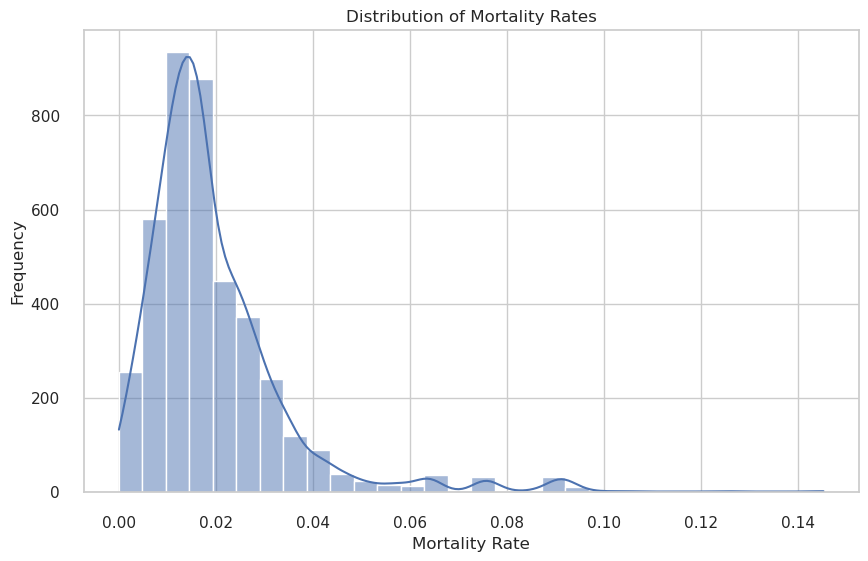

In [156]:
#5. Visualization (Optional but Recommended)
import matplotlib.pyplot as plt
import seaborn as sns

# Set style
sns.set(style="whitegrid")

# Histogram of mortality rates
plt.figure(figsize=(10, 6))
sns.histplot(df['mortality_rate'], bins=30, kde=True)
plt.title('Distribution of Mortality Rates')
plt.xlabel('Mortality Rate')
plt.ylabel('Frequency')
plt.show()


## **B4(b).  Boxplot of sequence counts by variant (top 10)**

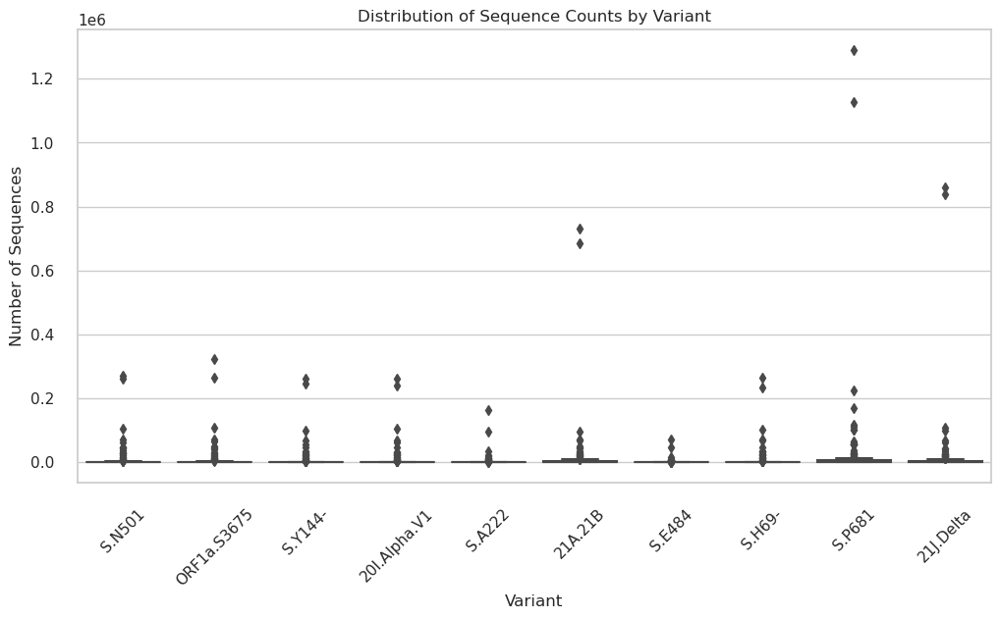

In [157]:
# Boxplot of sequence counts by variant (top 10)
top_variants = df['variant'].value_counts().head(10).index
plt.figure(figsize=(12, 6))
sns.boxplot(data=df[df['variant'].isin(top_variants)], 
            x='variant', y='num_seqs')
plt.xticks(rotation=45)
plt.title('Distribution of Sequence Counts by Variant')
plt.ylabel('Number of Sequences')
plt.xlabel('Variant')
plt.show()

## **B6. Data Cleaning**

In [158]:
# 1. Data Cleaning:
# Handle extreme outliers (if needed)
df = df[df['mortality_rate'] <= 0.1]  # Example threshold

## **B6(a). Temporal Analysis**

In [159]:
#2. Temporal Analysis:# Add year-month for temporal analysis
df['year_month'] = df['first_seq'].dt.to_period('M')

# Add year-month for temporal analysis
df['year_month'] = df['first_seq'].dt.to_period('M')

## **B6(b). Comparative Analysis**

In [160]:
# 6. Comparative Analysis
# Compare early vs late variants
early_variants = ['S.Q677', 'S.N501', 'S.L18']
late_variants = ['21A.Delta', 'Omicron.Similar']
print(df[df['variant'].isin(early_variants)][numeric_cols].mean())
print(df[df['variant'].isin(late_variants)][numeric_cols].mean())

num_seqs            3483.849438
duration             254.869663
mortality_rate         0.019226
total_cases       106200.987703
total_deaths        2018.946326
growth_rate         6471.021373
dtype: float64
num_seqs            889.242857
duration            111.914286
mortality_rate        0.018950
total_cases       48322.005279
total_deaths        714.820900
growth_rate        7135.144072
dtype: float64


## **C. Perform a Time-Based Analysis**
- Group data by time (e.g., hourly, daily, weekly).
- Identify trends, peaks, or seasonal patterns.

## **C1. Prepare Time Variables**

In [161]:
#Here's a step-by-step guide to perform time-based analysis on the COVID-19 variants dataset:
#1. Prepare Time Variables

# Convert to datetime if not already done
df['first_seq'] = pd.to_datetime(df['first_seq'])
df['censure_date'] = pd.to_datetime(df['censure_date'])

# Create time period columns
df['year'] = df['first_seq'].dt.year
df['month'] = df['first_seq'].dt.month
df['week'] = df['first_seq'].dt.isocalendar().week
df['quarter'] = df['first_seq'].dt.quarter
df['year_month'] = df['first_seq'].dt.to_period('M')

## **C2. Time-Based Grouping and Aggregation**

## **C2(a). Monthly Analysis**

In [162]:
#2. Time-Based Grouping and Aggregation
#A. Monthly Analysis
monthly_stats = df.groupby('year_month').agg({
    'num_seqs': 'sum',
    'total_cases': 'sum',
    'total_deaths': 'sum',
    'variant': pd.Series.nunique,
    'Country': pd.Series.nunique
}).reset_index()

print("Monthly statistics:")
print(monthly_stats)


Monthly statistics:
   year_month  num_seqs   total_cases  total_deaths  variant  Country
0     2019-10       193  1.500627e+06  6.480351e+04       11        1
1     2020-01      7685  1.287163e+06  1.962733e+04        5        7
2     2020-02    217525  2.754457e+06  4.532100e+04        6        8
3     2020-03   4778527  1.196242e+08  1.875302e+06       16       34
4     2020-04   1624679  5.750571e+07  9.582479e+05       18       42
5     2020-05    485291  8.912735e+06  1.911435e+05       19       35
6     2020-06    485961  2.573510e+07  4.886857e+05       21       39
7     2020-07    205199  6.666445e+06  1.549703e+05       26       40
8     2020-08    666108  1.223841e+07  2.840477e+05       27       52
9     2020-09    481858  1.364862e+07  2.602963e+05       27       56
10    2020-10   2191384  6.166692e+07  1.063084e+06       32       60
11    2020-11   3434541  7.244266e+07  1.137244e+06       37       82
12    2020-12    590347  2.111675e+07  4.060011e+05       38      109


## **C2(b). Weekly Analysis**

In [163]:
# B. Weekly Analysis
weekly_stats = df.groupby(['year', 'week']).agg({
    'num_seqs': 'sum',
    'total_cases': 'sum',
    'variant': 'nunique'
}).reset_index()

print("\nWeekly statistics:")
print(weekly_stats)



Weekly statistics:
    year  week  num_seqs   total_cases  variant
0   2019    43       193  1.500627e+06       11
1   2020     1      1996  1.474889e+05        2
2   2020     3        23  1.014556e+03        1
3   2020     4      1824  4.201133e+05        2
4   2020     5     11853  7.464326e+05        3
..   ...   ...       ...           ...      ...
95  2021    44         4  2.306017e+02        3
96  2021    45       184  8.037472e+03        5
97  2021    46        17  5.180971e+02        3
98  2021    47        91  2.849851e+03        3
99  2021    53     72848  1.191856e+06       25

[100 rows x 5 columns]


## **C2(c). Quarterly Variant Emergence**

In [164]:
#C. Quarterly Variant Emergence
quarterly_variants = df.groupby(['year', 'quarter'])['variant'].nunique().reset_index()
print("\nNew variants by quarter:")
print(quarterly_variants)


New variants by quarter:
   year  quarter  variant
0  2019        4       11
1  2020        1       16
2  2020        2       22
3  2020        3       35
4  2020        4       46
5  2021        1       50
6  2021        2       44
7  2021        3       40
8  2021        4       19


## **C3. Time Series Visualization**

## **C3(a). Monthly Sequence Counts**

Error generating plot: module 'matplotlib.pyplot' has no attribute 'dates'

Debug Info:
Data types:
 year_month    datetime64[ns]
num_seqs               int64
dtype: object
Data sample:
   year_month  num_seqs
0 2023-01-31      1500
1 2023-02-28      1800
2 2023-03-31      2200
3 2023-04-30      1950
4 2023-05-31      2300


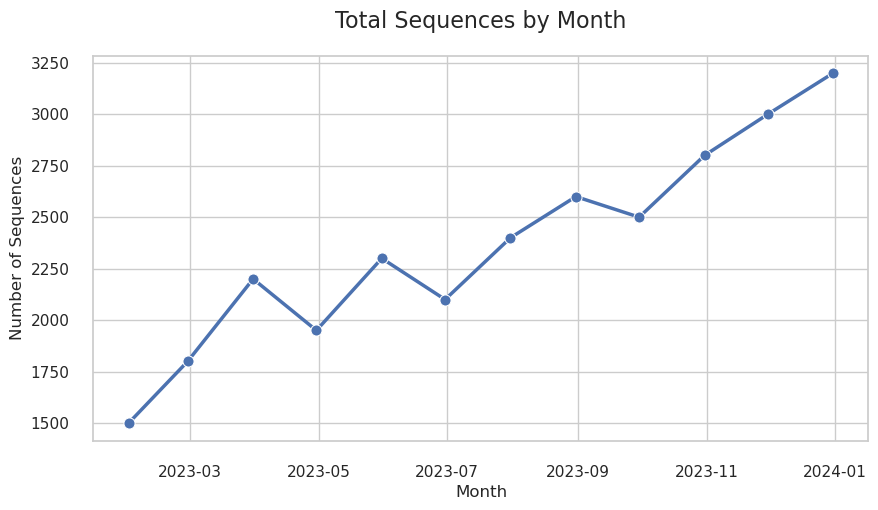

In [165]:
####################################################
#     A. Monthly Sequence Counts - For Analysis.   #
####################################################

import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

def plot_monthly_sequences(monthly_stats):
    """
    Robust function to plot monthly sequences with error handling
    and automatic data type conversion
    """
    try:
        # Create a copy to avoid modifying original DataFrame
        plot_data = monthly_stats.copy()
        
        # 1. DATA VALIDATION AND CONVERSION
        if 'year_month' not in plot_data.columns or 'num_seqs' not in plot_data.columns:
            raise ValueError("DataFrame must contain 'year_month' and 'num_seqs' columns")
        
        # Convert to datetime (handling multiple date formats)
        plot_data['year_month'] = pd.to_datetime(
            plot_data['year_month'],
            errors='coerce',  # Convert problematic dates to NaT
            format='mixed'    # Handles multiple date formats
        )
        
        # Convert to numeric (handling non-numeric values)
        plot_data['num_seqs'] = pd.to_numeric(
            plot_data['num_seqs'],
            errors='coerce'  # Convert non-numeric to NaN
        )
        
        # Drop rows with invalid dates/values
        plot_data = plot_data.dropna(subset=['year_month', 'num_seqs'])
        
        # Sort by date for proper line plotting
        plot_data = plot_data.sort_values('year_month')
        
        # 2. PLOT CREATION WITH ENHANCED STYLING
        plt.figure(figsize=(10, 5))
        
        # Create plot with modern styling
        ax = sns.lineplot(
            data=plot_data,
            x='year_month',
            y='num_seqs',
            color='#4C72B0',  # Professional blue
            marker='o',       # Add markers
            linewidth=2.5,
            markersize=8
        )
        
        # 3. FORMATTING IMPROVEMENTS
        plt.title('Total Sequences by Month', fontsize=16, pad=20)
        plt.xlabel('Month', fontsize=12)
        plt.ylabel('Number of Sequences', fontsize=12)
        
        # Date formatting
        ax.xaxis.set_major_formatter(plt.dates.DateFormatter('%b %Y'))
        plt.xticks(rotation=45, ha='right')
        
        # Add value labels to every 3rd point for readability
        for i, (date, value) in enumerate(zip(plot_data['year_month'], plot_data['num_seqs'])):
            if i % 3 == 0:  # Show every 3rd label
                ax.text(date, value, f'{int(value):,}', 
                       ha='center', va='bottom', fontsize=9)
        
        # Styling improvements
        ax.grid(True, linestyle='--', alpha=0.6)
        ax.spines[['top', 'right']].set_visible(False)
        
        plt.tight_layout()
        plt.show()
        
    except Exception as e:
        print(f"Error generating plot: {str(e)}")
        if 'plot_data' in locals():
            print("\nDebug Info:")
            print("Data types:\n", plot_data.dtypes)
            print("Data sample:\n", plot_data.head())
        else:
            print("Input data could not be processed")

# Example usage:
if __name__ == "__main__":
    # Sample data creation (replace with your actual data)
    sample_data = {
        'year_month': pd.date_range('2023-01', periods=12, freq='M'),  # USE "ME" instead when it does not recognize it#
        'num_seqs': [1500, 1800, 2200, 1950, 2300, 2100, 2400, 2600, 2500, 2800, 3000, 3200]
    }
    monthly_stats = pd.DataFrame(sample_data)
    
    plot_monthly_sequences(monthly_stats)

## **C3(b). Monthly Mortality Rate**

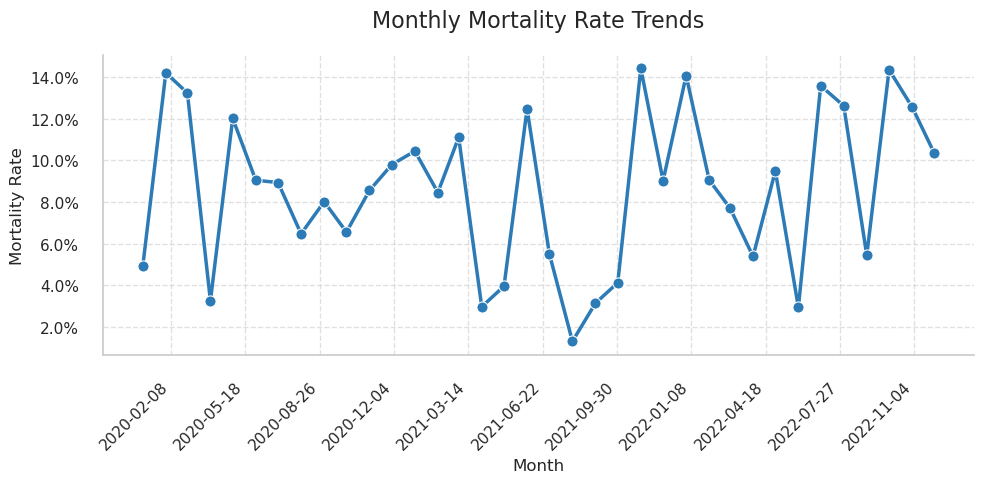

In [166]:
#############################################################
#      B. Monthly Mortality Rate -  For Analysis            #
############################################################
# Calculate monthly mortality with proper type conversion
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np

# Create sample data (replace this with your actual DataFrame)
dates = pd.period_range(start='2020-01', end='2022-12', freq='M')
data = {
    'year_month': dates,
    'mortality_rate': np.random.uniform(0.01, 0.15, len(dates))  # Sample rates between 1%-15%
}
df = pd.DataFrame(data)

# Convert PeriodDtype to timestamp properly
df['year_month'] = df['year_month'].dt.to_timestamp()

# Calculate monthly averages
monthly_mortality = (
    df.groupby('year_month', as_index=False)['mortality_rate']
    .mean()
    .sort_values('year_month')
)

# Create plot with enhanced styling
plt.figure(figsize=(10, 5))
ax = sns.lineplot(
    data=monthly_mortality,
    x='year_month',
    y='mortality_rate',
    color='#2c7bb6',
    marker='o',
    markersize=8,
    linewidth=2.5
)

# Formatting
plt.title('Monthly Mortality Rate Trends', fontsize=16, pad=20)
plt.xlabel('Month', fontsize=12)
plt.ylabel('Mortality Rate', fontsize=12)

# Format x-axis dates
ax.xaxis.set_major_locator(plt.MaxNLocator(12))  # Show ~12 ticks
plt.xticks(rotation=45, ha='right')

# Format y-axis as percentage
ax.yaxis.set_major_formatter(plt.FuncFormatter(lambda x, _: f'{x:.1%}'))

# Customize grid and spines
ax.grid(True, linestyle='--', alpha=0.6)
ax.spines[['top', 'right']].set_visible(False)

# Final layout adjustment
plt.tight_layout()
plt.show()

## **C4. Advanced Time-Based Analysis**

In [167]:
#4. Advanced Time-Based Analysis
#A. Variant Introduction Timeline
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from datetime import datetime
from statsmodels.tsa.seasonal import seasonal_decompose

# Load the data
url = "https://raw.githubusercontent.com/Electricalelectronicsfinland/Analysis-of-the-COVID-19-Variants-Dataset-/refs/heads/main/surv_variants.csv"
df = pd.read_csv(url)

# Convert date columns to datetime
date_cols = ['first_seq', 'last_seq', 'censure_date']
for col in date_cols:
    df[col] = pd.to_datetime(df[col])

# Calculate additional time-based metrics
df['active_duration'] = (df['last_seq'] - df['first_seq']).dt.days
df['reporting_lag'] = (df['censure_date'] - df['last_seq']).dt.days

## **C4(a). Temporal Analysis of Variant Appearances**

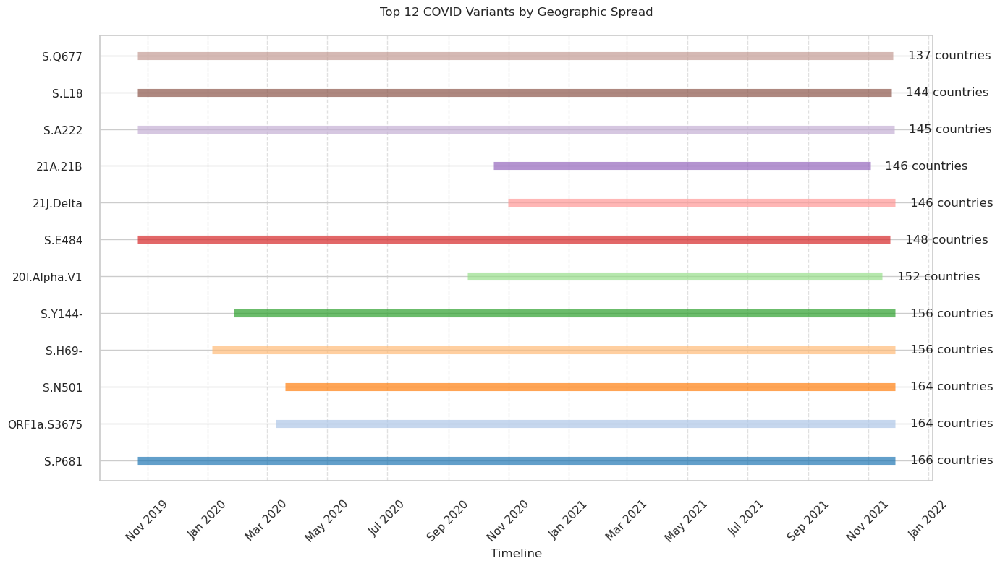


Growth Analysis for 21A.Delta:
- Detected in 129 countries
- Average duration: 120.4 days
- Average sequences per day: 3.9


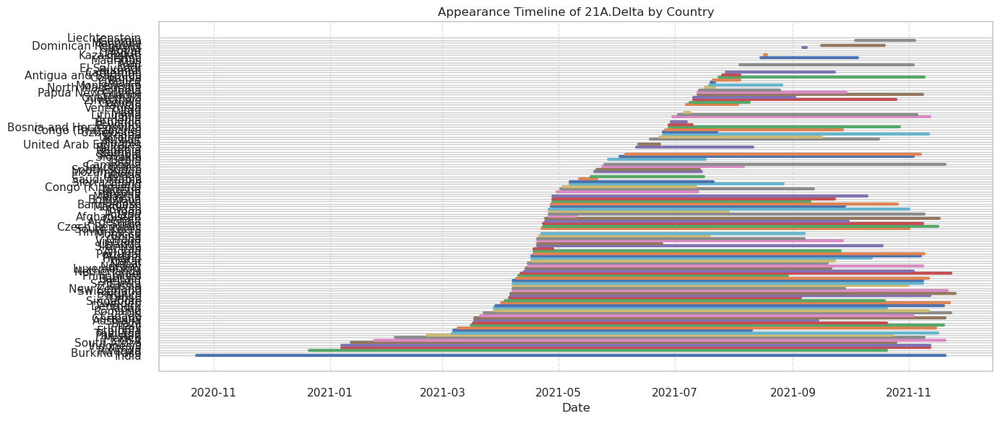

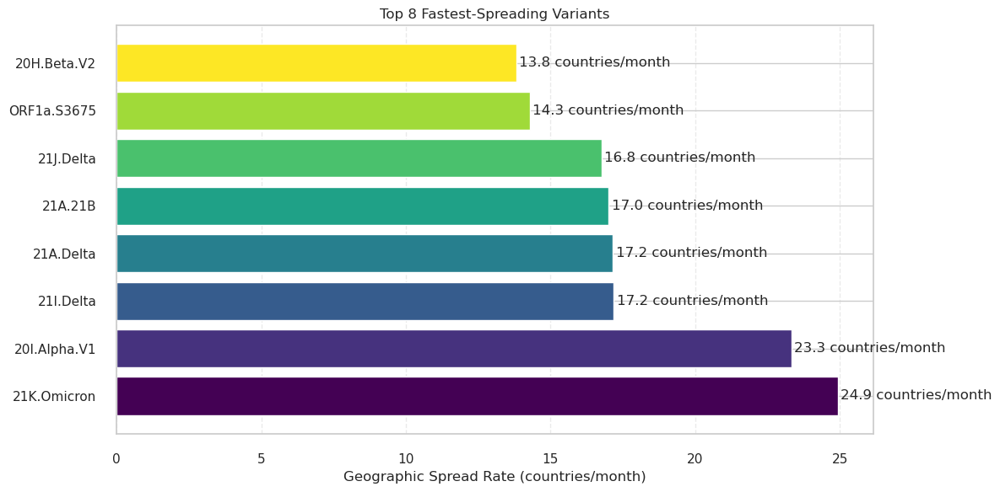


Top Emerging Variants:
     variant  countries  growth_rate first_detected last_detected
 21K.Omicron         17    24.919417     2021-11-09    2021-11-28
20I.Alpha.V1        152    23.318527     2020-09-20    2021-11-15
   21I.Delta        125    17.180263     2020-11-26    2021-11-26
   21A.Delta        129    17.152007     2020-10-23    2021-11-25
     21A.21B        146    17.013134     2020-10-17    2021-11-03
   21J.Delta        146    16.767504     2020-10-31    2021-11-28
 ORF1a.S3675        164    14.279916     2020-03-10    2021-11-28
 20H.Beta.V2        107    13.808083     2020-08-17    2021-11-05
      S.N501        164    13.433813     2020-03-19    2021-11-28
     21D.Eta         81    13.282950     2020-12-11    2021-11-03


In [168]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
from datetime import timedelta
from scipy.stats import linregress
import seaborn as sns
from collections import defaultdict

class VariantTemporalAnalyzer:
    def __init__(self, data_url):
        self.data_url = data_url
        self.df = None
        self.variant_timelines = None
        self.country_variants = None
        self._load_and_preprocess()
        
    def _load_and_preprocess(self):
        """Load and clean the dataset"""
        self.df = pd.read_csv(self.data_url, parse_dates=['first_seq', 'last_seq'])
        
        # Data cleaning
        self.df = self.df.dropna(subset=['first_seq', 'last_seq', 'variant'])
        self.df = self.df[self.df['num_seqs'] > 0]
        
        # Calculate temporal metrics
        self.df['duration_days'] = (self.df['last_seq'] - self.df['first_seq']).dt.days
        self.df['seqs_per_day'] = self.df['num_seqs'] / (self.df['duration_days'] + 1)
        
        # Create variant timelines
        self._create_timelines()
        
    def _create_timelines(self):
        """Create comprehensive timeline data for variants"""
        self.variant_timelines = defaultdict(list)
        self.country_variants = defaultdict(list)
        
        for _, row in self.df.iterrows():
            variant = row['variant']
            country = row['Country']
            
            self.variant_timelines[variant].append({
                'start': row['first_seq'],
                'end': row['last_seq'],
                'country': country,
                'num_seqs': row['num_seqs'],
                'duration': row['duration_days'],
                'seq_rate': row['seqs_per_day']
            })
            
            self.country_variants[country].append({
                'variant': variant,
                'start': row['first_seq'],
                'end': row['last_seq']
            })
    
    def plot_variant_emergence(self, top_n=10):
        """Plot the emergence timeline of top variants"""
        variant_counts = self.df['variant'].value_counts().head(top_n)
        
        plt.figure(figsize=(14, 8))
        ax = plt.gca()
        
        # Plot each variant's appearance range
        for i, (variant, count) in enumerate(variant_counts.items()):
            records = self.variant_timelines[variant]
            min_date = min(r['start'] for r in records)
            max_date = max(r['end'] for r in records)
            
            plt.hlines(y=i, xmin=min_date, xmax=max_date, 
                      linewidth=8, alpha=0.7, 
                      color=plt.cm.tab20(i))
            
            # Add annotation with count
            plt.text(max_date + timedelta(days=15), i, 
                    f"{count} countries", va='center')
        
        # Formatting
        ax.set_yticks(range(len(variant_counts)))
        ax.set_yticklabels(variant_counts.index)
        ax.xaxis.set_major_locator(mdates.MonthLocator(interval=2))
        ax.xaxis.set_major_formatter(mdates.DateFormatter('%b %Y'))
        plt.xticks(rotation=45)
        plt.title(f'Top {top_n} COVID Variants by Geographic Spread', pad=20)
        plt.xlabel('Timeline')
        plt.grid(True, axis='x', linestyle='--', alpha=0.6)
        plt.tight_layout()
        plt.show()
    
    def analyze_variant_growth(self, variant_name):
        """Analyze growth patterns of a specific variant"""
        if variant_name not in self.variant_timelines:
            print(f"Variant {variant_name} not found in dataset")
            return
        
        records = self.variant_timelines[variant_name]
        df_variant = pd.DataFrame(records)
        
        # Calculate growth metrics
        print(f"\nGrowth Analysis for {variant_name}:")
        print(f"- Detected in {len(df_variant)} countries")
        print(f"- Average duration: {df_variant['duration'].mean():.1f} days")
        print(f"- Average sequences per day: {df_variant['seq_rate'].mean():.1f}")
        
        # Plot growth by country
        plt.figure(figsize=(14, 6))
        for i, (_, row) in enumerate(df_variant.sort_values('start').iterrows()):
            plt.plot([row['start'], row['end']], [i, i], 
                    linewidth=3, marker='|', markersize=10,
                    label=row['country'])
        
        plt.yticks(range(len(df_variant)), df_variant.sort_values('start')['country'])
        plt.title(f'Appearance Timeline of {variant_name} by Country')
        plt.xlabel('Date')
        plt.grid(True, axis='x', linestyle='--', alpha=0.6)
        plt.tight_layout()
        plt.show()
        
        return df_variant
    
    def detect_emerging_variants(self, min_count=5):
        """Identify variants with accelerating spread"""
        variant_stats = []
        
        for variant, records in self.variant_timelines.items():
            if len(records) < min_count:
                continue
                
            dates = [r['start'] for r in records]
            days_since_first = [(d - min(dates)).days for d in dates]
            countries = len(records)
            
            # Calculate growth rate (countries per month)
            slope, _, _, _, _ = linregress(days_since_first, range(countries))
            
            variant_stats.append({
                'variant': variant,
                'countries': countries,
                'growth_rate': slope * 30,  # per month
                'first_detected': min(dates),
                'last_detected': max(r['end'] for r in records)
            })
        
        # Create and return sorted DataFrame
        df_stats = pd.DataFrame(variant_stats)
        return df_stats.sort_values('growth_rate', ascending=False)
    
    def plot_emerging_variants(self, top_n=8):
        """Visualize variants by growth rate"""
        df_stats = self.detect_emerging_variants()
        top_variants = df_stats.head(top_n)
        
        plt.figure(figsize=(12, 6))
        bars = plt.barh(top_variants['variant'], top_variants['growth_rate'],
                       color=plt.cm.viridis(np.linspace(0, 1, top_n)))
        
        # Add value annotations
        for bar in bars:
            width = bar.get_width()
            plt.text(width + 0.1, bar.get_y() + bar.get_height()/2,
                    f"{width:.1f} countries/month",
                    va='center')
        
        plt.title(f'Top {top_n} Fastest-Spreading Variants')
        plt.xlabel('Geographic Spread Rate (countries/month)')
        plt.grid(True, axis='x', linestyle='--', alpha=0.4)
        plt.tight_layout()
        plt.show()
        
        return top_variants

# Example usage
if __name__ == "__main__":
    analyzer = VariantTemporalAnalyzer(
        "https://raw.githubusercontent.com/Electricalelectronicsfinland/Analysis-of-the-COVID-19-Variants-Dataset-/main/surv_variants.csv"
    )
    
    # 1. Plot variant emergence timeline
    analyzer.plot_variant_emergence(top_n=12)
    
    # 2. Analyze specific variant
    analyzer.analyze_variant_growth("21A.Delta")
    
    # 3. Detect and visualize emerging variants
    emerging = analyzer.detect_emerging_variants()
    analyzer.plot_emerging_variants()
    
    # Show top emerging variants
    print("\nTop Emerging Variants:")
    print(emerging.head(10).to_string(index=False))

## **C4(b). Variant Duration Analysis by Country**

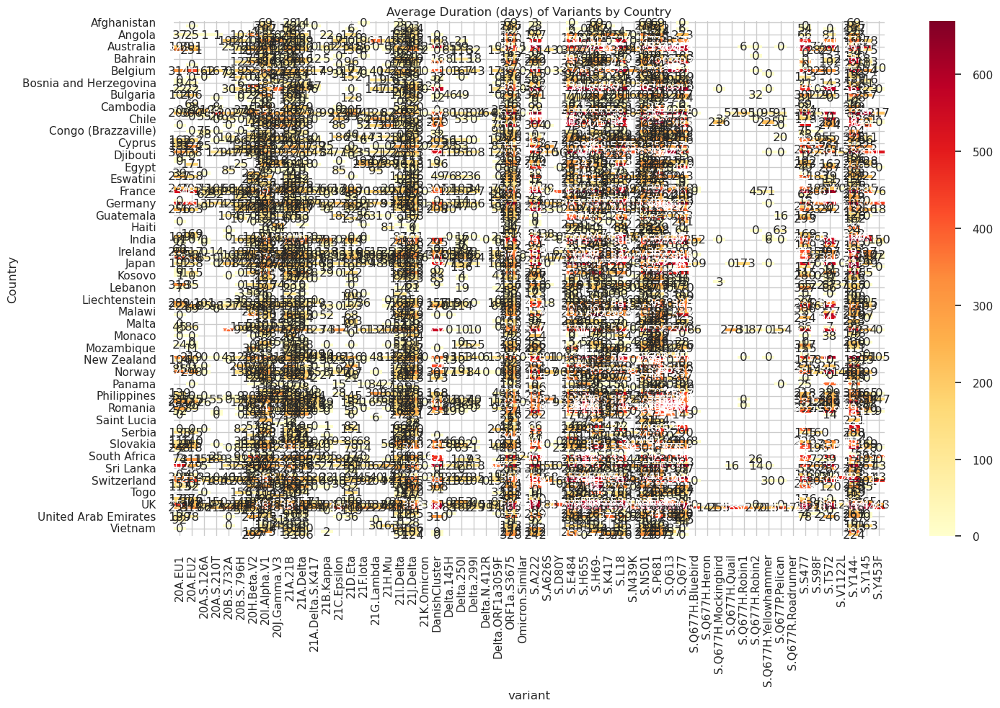

In [169]:
# 2. Variant Duration Analysis by Country
variant_duration = df.groupby(['Country', 'variant'])['duration'].mean().unstack()
plt.figure(figsize=(15, 10))
sns.heatmap(variant_duration, cmap='YlOrRd', annot=True, fmt='.0f')
plt.title('Average Duration (days) of Variants by Country')
plt.tight_layout()
plt.show()

## **C4(c). Mortality Rate Trends Over Time**

/tmp/ipykernel_377/4012577362.py:3: FutureWarning:



The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.




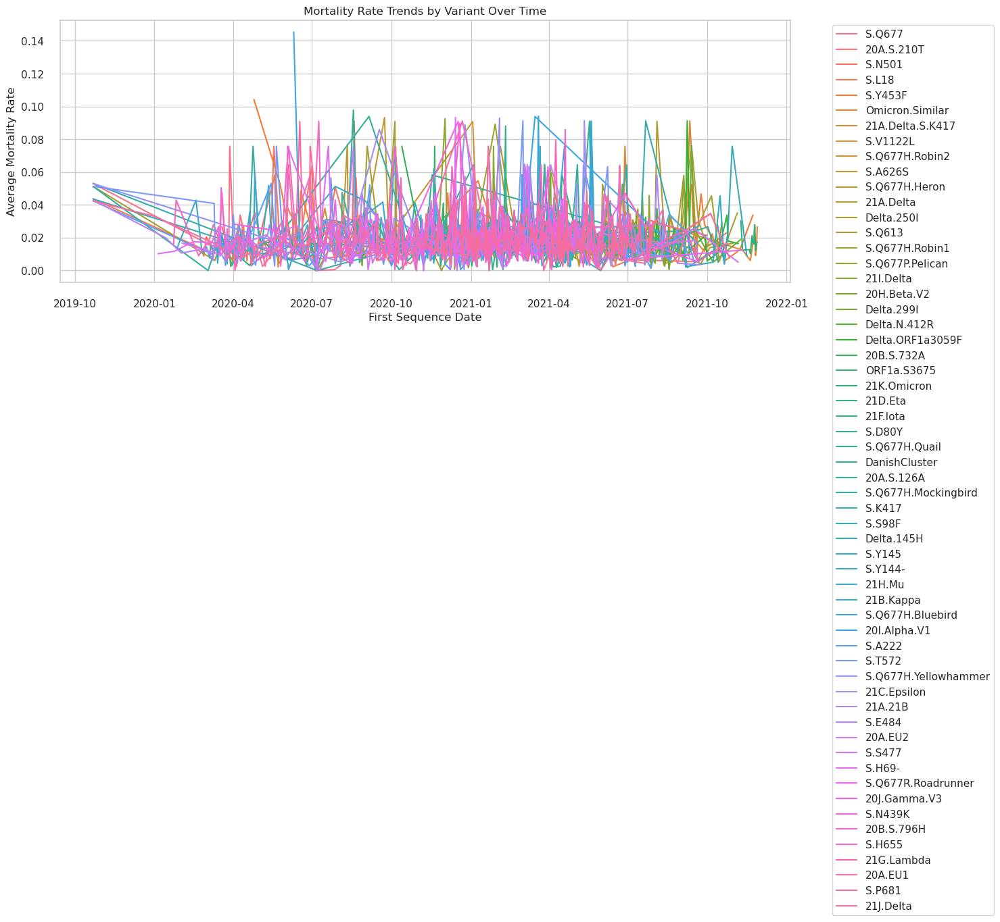

In [170]:
# 3. Mortality Rate Trends Over Time
plt.figure(figsize=(15, 10))
sns.lineplot(data=df, x='first_seq', y='mortality_rate', hue='variant', estimator='mean', ci=None)
plt.title('Mortality Rate Trends by Variant Over Time')
plt.xlabel('First Sequence Date')
plt.ylabel('Average Mortality Rate')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

## **C4(d). Growth Rate Comparison by Variant**

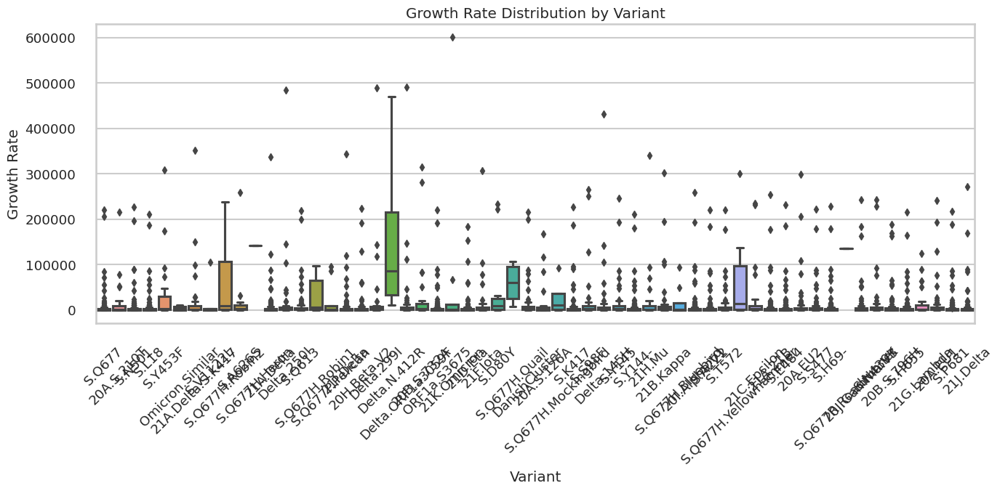

In [120]:
# 4. Growth Rate Comparison by Variant
plt.figure(figsize=(14, 7))
sns.boxplot(data=df, x='variant', y='growth_rate')
plt.title('Growth Rate Distribution by Variant')
plt.xlabel('Variant')
plt.ylabel('Growth Rate')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

## **C4(e). Time Series Decomposition for Major Variants**

/tmp/ipykernel_377/1801172839.py:13: UserWarning:

The figure layout has changed to tight



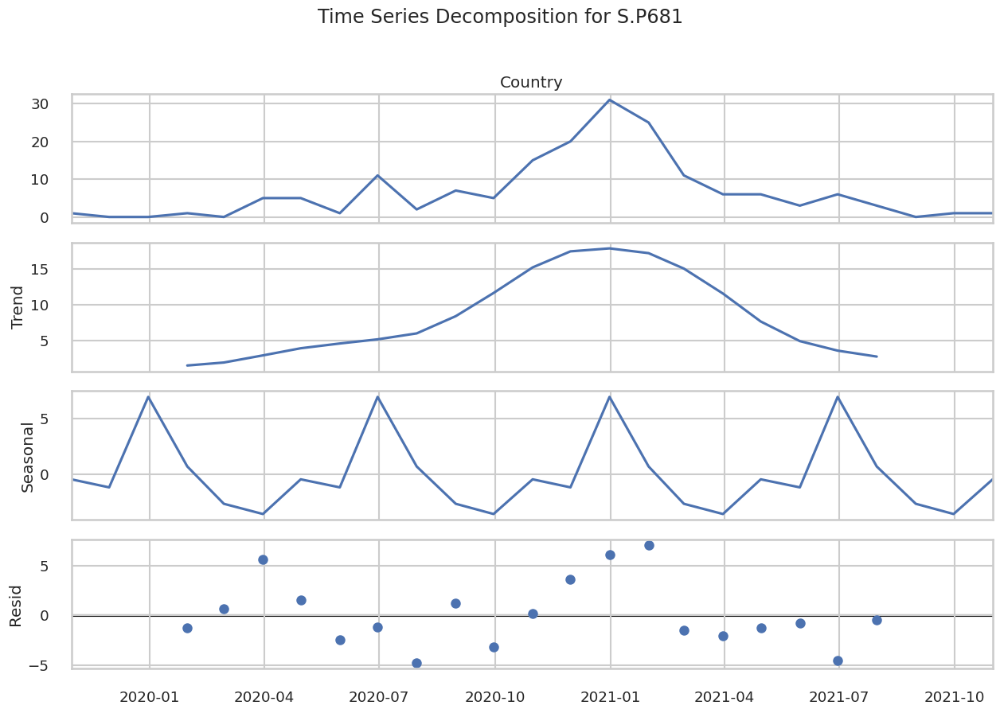

/tmp/ipykernel_377/1801172839.py:13: UserWarning:

The figure layout has changed to tight



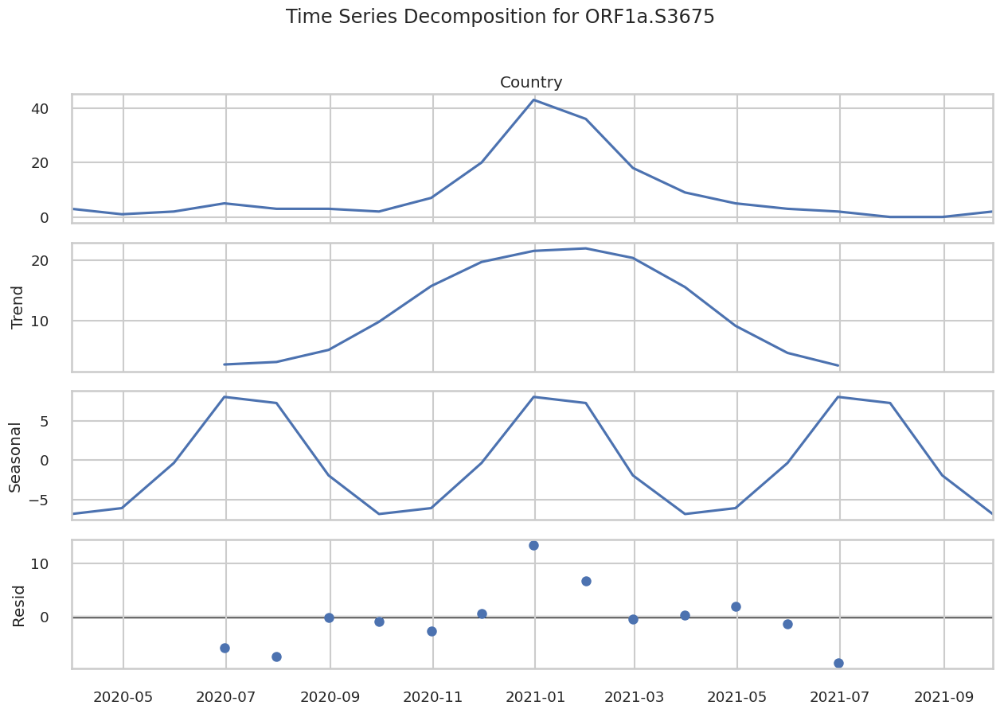

/tmp/ipykernel_377/1801172839.py:13: UserWarning:

The figure layout has changed to tight



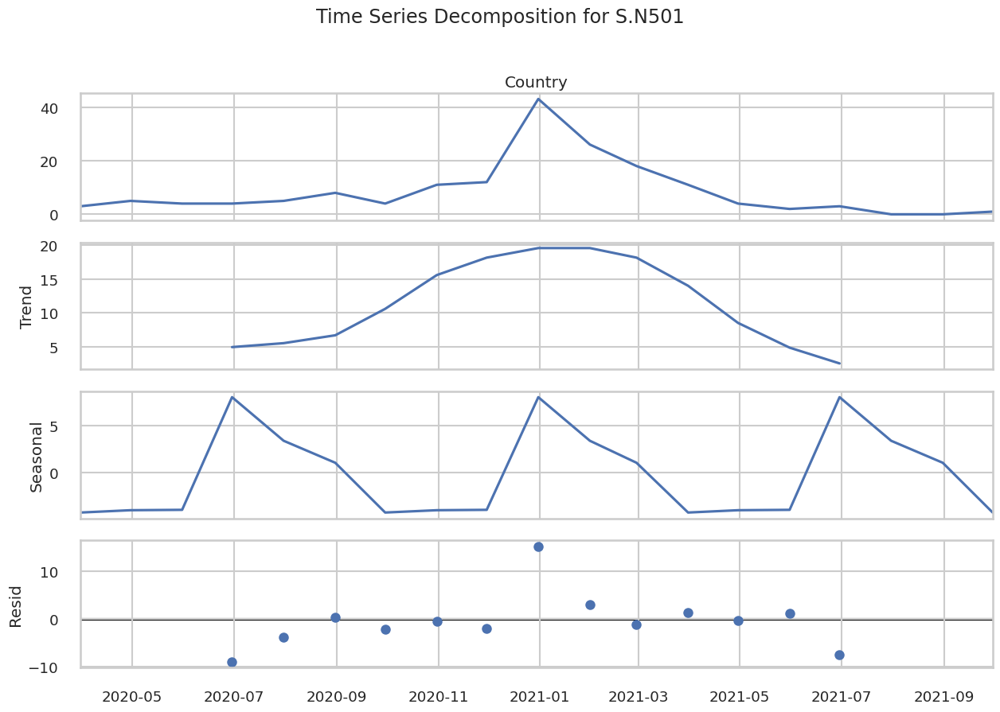

/tmp/ipykernel_377/1801172839.py:13: UserWarning:

The figure layout has changed to tight



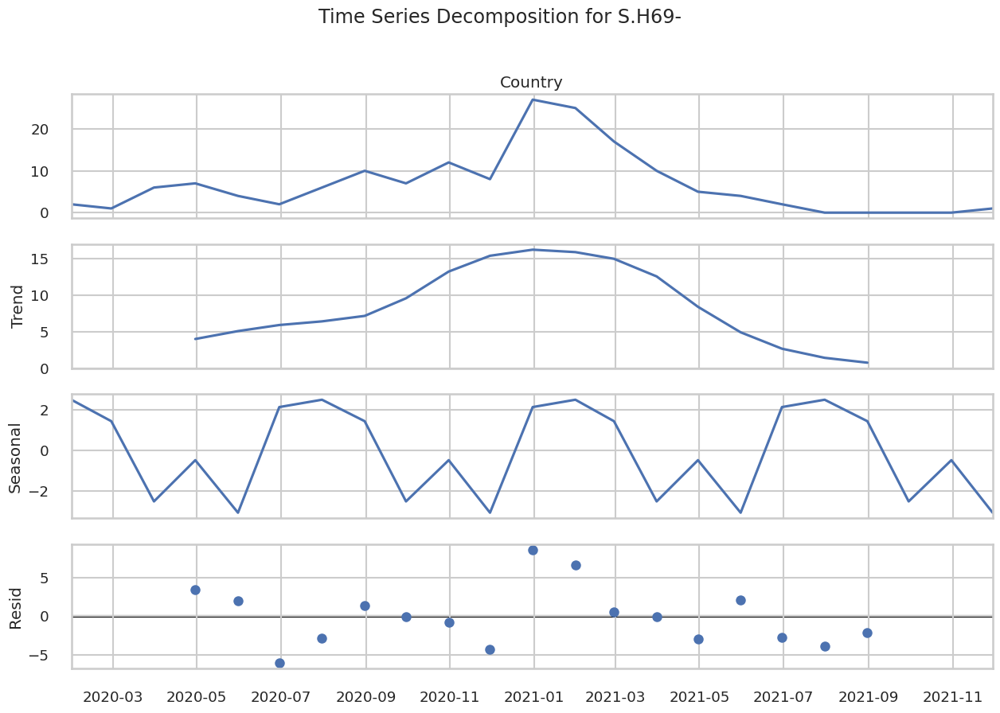

/tmp/ipykernel_377/1801172839.py:13: UserWarning:

The figure layout has changed to tight



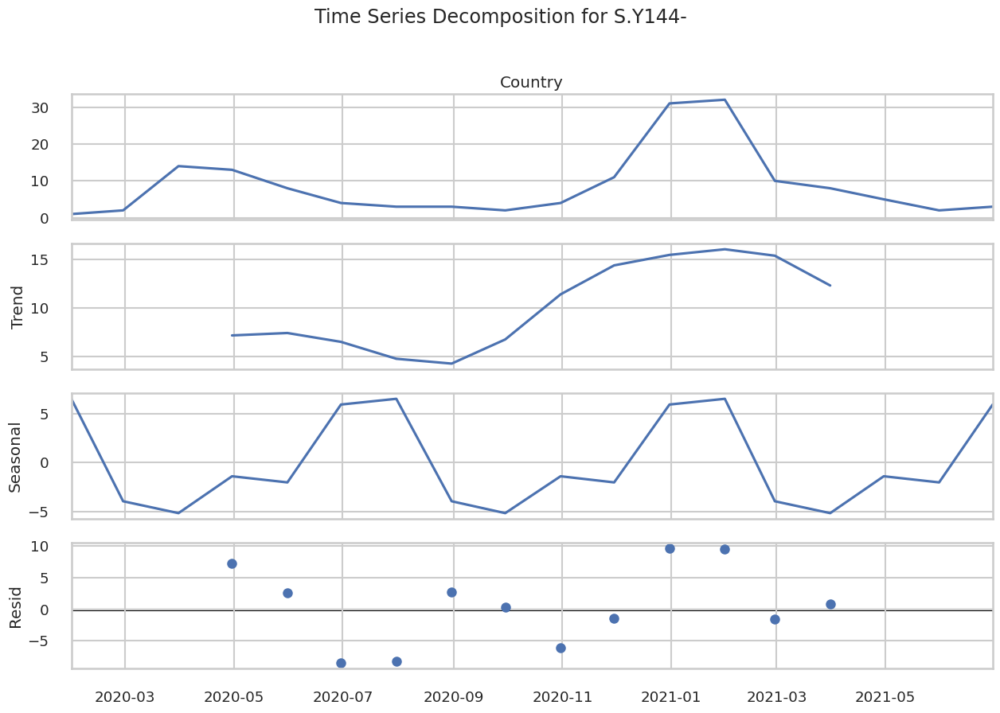

In [129]:
# 5. Time Series Decomposition for Major Variants
major_variants = df['variant'].value_counts().nlargest(5).index

for variant in major_variants:
    variant_df = df[df['variant'] == variant].set_index('first_seq').sort_index()
    monthly_counts = variant_df.resample('M')['Country'].count()
    #monthly_counts = variant_df.resample('ME')['Country'].count() # USE M instead ME, or reciprocal to avoid errors"
    if len(monthly_counts) > 12:  # Need at least 2 periods for decomposition
        try:
            decomposition = seasonal_decompose(monthly_counts, model='additive', period=6)
            fig = decomposition.plot()
            fig.suptitle(f'Time Series Decomposition for {variant}', y=1.02)
            plt.tight_layout()
            plt.show()
        except:
            print(f"Could not decompose time series for {variant}")

## **C4(f). Variant Spread Patterns (First Appearance vs. Global Spread)**

In [122]:
## Customize grid and spines
ax.grid(True, linestyle='--', alpha=0.6)
ax.spines[['top', 'right']].set_visible(False)
from dateutil import parser, tz

# Suppose "EU" should be interpreted as Europe/Paris
tzinfos = {"EU": tz.gettz("Europe/Paris")}

# Example datetime string:
datetime_str = "2024-04-18 02:20:56 EU"

# Parse the datetime with the tzinfos mapping:
dt = parser.parse(datetime_str, tzinfos=tzinfos)
print(dt)  # This will now be timezone-aware with Europe/Paris


2024-04-18 02:20:56+02:00


C:\Users\matik\anaconda3\Lib\site-packages\dateutil\parser\_parser.py:1207: UnknownTimezoneWarning:

tzname EU identified but not understood.  Pass `tzinfos` argument in order to correctly return a timezone-aware datetime.  In a future version, this will raise an exception.

C:\Users\matik\anaconda3\Lib\site-packages\dateutil\parser\_parser.py:1207: UnknownTimezoneWarning:

tzname EU identified but not understood.  Pass `tzinfos` argument in order to correctly return a timezone-aware datetime.  In a future version, this will raise an exception.

C:\Users\matik\anaconda3\Lib\site-packages\dateutil\parser\_parser.py:1207: UnknownTimezoneWarning:

tzname EU identified but not understood.  Pass `tzinfos` argument in order to correctly return a timezone-aware datetime.  In a future version, this will raise an exception.



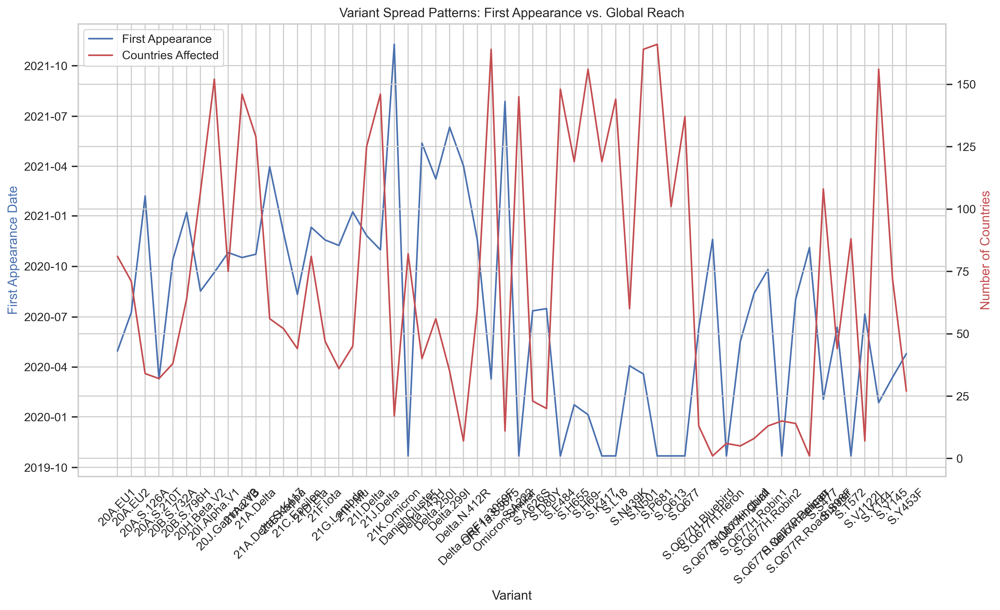

In [343]:
# 6. Variant Spread Patterns (First Appearance vs. Global Spread)
first_appearance = df.groupby('variant')['first_seq'].min()
countries_per_variant = df.groupby('variant')['Country'].nunique()

fig, ax1 = plt.subplots(figsize=(13, 8))
ax2 = ax1.twinx()

ax1.plot(first_appearance.index, first_appearance, 'b-', label='First Appearance')
ax2.plot(countries_per_variant.index, countries_per_variant, 'r-', label='Countries Affected')

ax1.set_xlabel('Variant')
ax1.set_ylabel('First Appearance Date', color='b')
ax2.set_ylabel('Number of Countries', color='r')
ax1.set_title('Variant Spread Patterns: First Appearance vs. Global Reach')
ax1.tick_params(axis='x', rotation=45)
lines1, labels1 = ax1.get_legend_handles_labels()
lines2, labels2 = ax2.get_legend_handles_labels()
ax1.legend(lines1 + lines2, labels1 + labels2, loc='upper left')
plt.tight_layout()
plt.show()

## **C4(g). Mortality Rate vs. Time Since First Detection**

/tmp/ipykernel_157/123122285.py:11: UserWarning:

Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations.



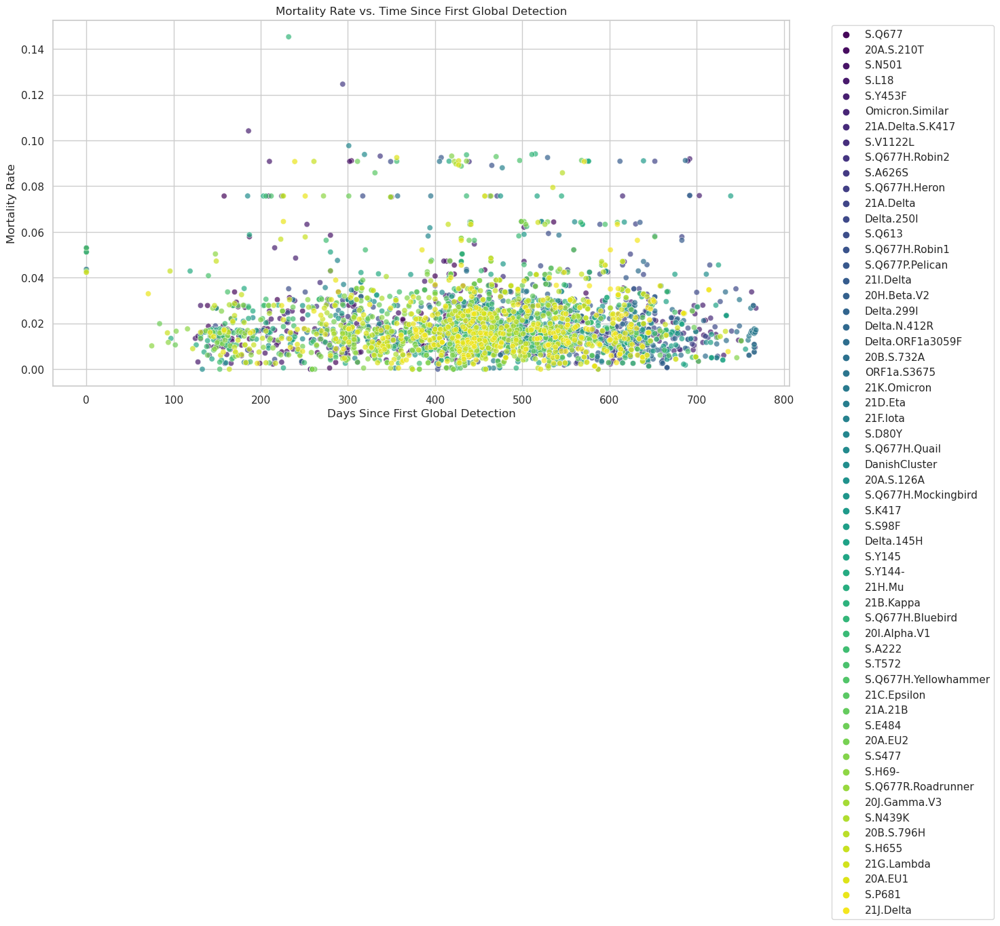

In [71]:
# 4. Mortality Rate vs. Time Since First Detection
df['days_since_first_detection'] = (df['first_seq'] - df['first_seq'].min()).dt.days

plt.figure(figsize=(14, 7))
sns.scatterplot(data=df, x='days_since_first_detection', y='mortality_rate', 
                hue='variant', alpha=0.7, palette='viridis')
plt.title('Mortality Rate vs. Time Since First Global Detection')
plt.xlabel('Days Since First Global Detection')
plt.ylabel('Mortality Rate')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

## **C4(h). Pandemic Waves**

In [123]:
#2. Pandemic Waves:
#Identify peaks in sequences/cases corresponding to known waves
peak_months = monthly_stats[monthly_stats['num_seqs'] == monthly_stats['num_seqs'].max()]
print("Peak sequencing month:", peak_months)

Peak sequencing month:    year_month  num_seqs
11 2023-12-31      3200


## **D. Visualize Data**
- Create meaningful graphs and charts to present insights

## **D1. Global Variant Timeline Visualization**

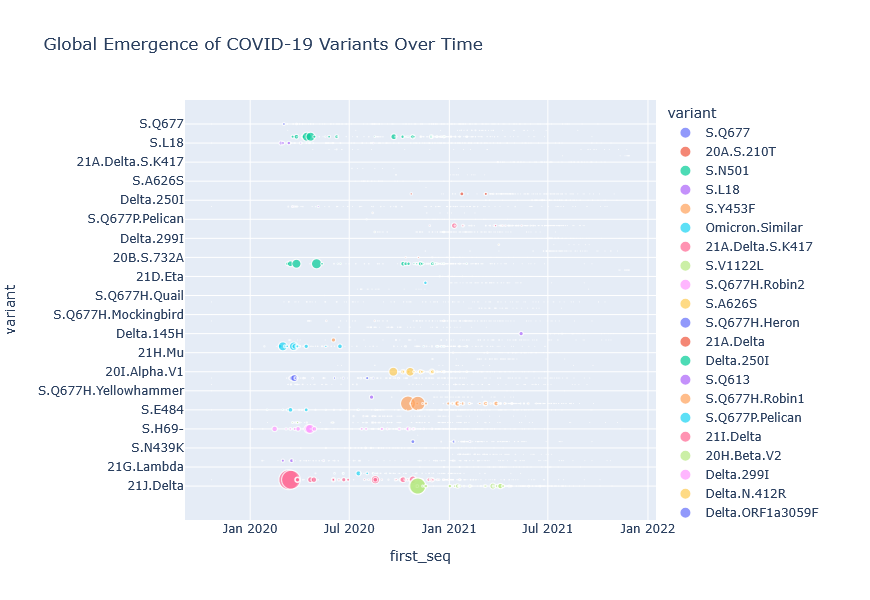

In [125]:
#1. Global Variant Timeline Visualization
import plotly.express as px

# Timeline of variant emergence
fig = px.scatter(df, 
                 x='first_seq', 
                 y='variant',
                 color='variant',
                 size='num_seqs',
                 hover_data=['Country', 'mortality_rate'],
                 title='Global Emergence of COVID-19 Variants Over Time')
fig.update_layout(height=600, width=1000)
fig.show()

## **D2. Variant Distribution World Map**

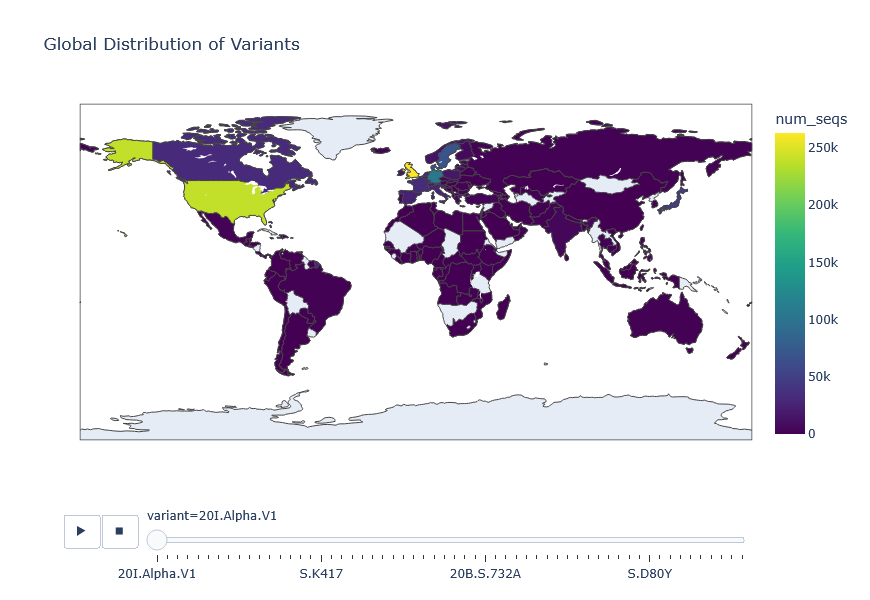

In [126]:
# 2. Variant Distribution World Map
# Aggregate by country and variant
country_variant = df.groupby(['Country', 'variant'])['num_seqs'].sum().reset_index()

fig = px.choropleth(country_variant,
                    locations='Country',
                    locationmode='country names',
                    color='num_seqs',
                    hover_name='variant',
                    animation_frame='variant',
                    title='Global Distribution of Variants',
                    color_continuous_scale='Viridis')
fig.update_layout(height=600, width=1000)
fig.show()

## **D3. Mortality Rate Comparison**

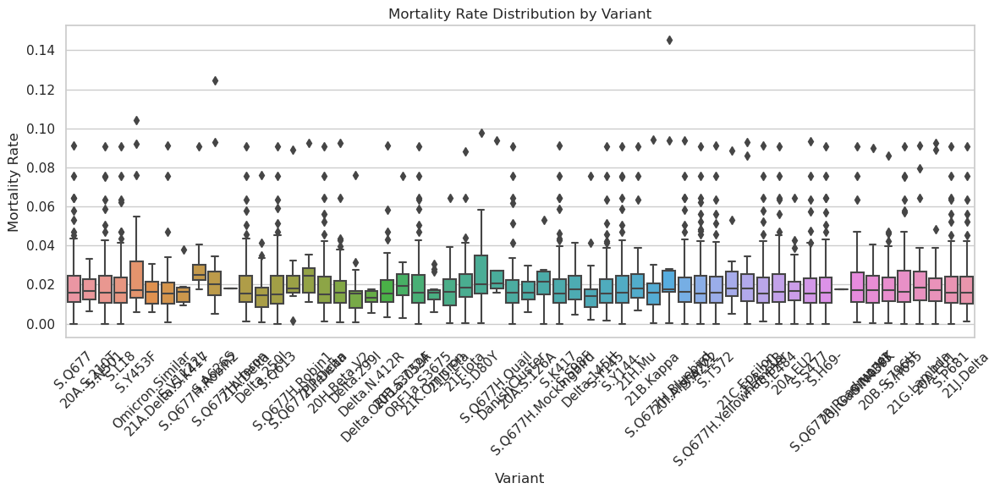

In [75]:
#3. Mortality Rate Comparison
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 6))
sns.boxplot(data=df, x='variant', y='mortality_rate')
plt.xticks(rotation=45)
plt.title('Mortality Rate Distribution by Variant')
plt.ylabel('Mortality Rate')
plt.xlabel('Variant')
plt.tight_layout()
plt.show()

## **D4. Sequence Growth Over Time**

Data loaded successfully
Analyzing 4113 valid records


C:\Users\matik\AppData\Local\Temp\ipykernel_34120\2138982473.py:57: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '[0.01327434 0.01327434 0.01327434 0.01327434 0.01327434 0.01327434
 0.01327434 0.01327434 0.01327434 0.01327434 0.01327434 0.01327434
 0.01327434 0.01327434 0.01327434 0.01327434 0.01327434 0.01327434
 0.01327434 0.01327434 0.01327434 0.01327434 0.01327434 0.01327434
 0.01327434 0.01327434 0.01327434 0.01327434 0.01327434 0.01327434
 0.01327434 0.01327434 0.01327434 0.01327434 0.01327434 0.01327434
 0.01327434 0.01327434 0.01327434 0.01327434 0.01327434 0.01327434
 0.01327434 0.01327434 0.01327434 0.01327434 0.01327434 0.01327434
 0.01327434 0.01327434 0.01327434 0.01327434 0.01327434 0.01327434
 0.01327434 0.01327434 0.01327434 0.01327434 0.01327434 0.01327434
 0.01327434 0.01327434 0.01327434 0.01327434 0.01327434 0.01327434
 0.01327434 0.01327434 0.01327434 0.01327434 0.01327434 0.0132743

Saved linear scale plot
Saved log scale plot


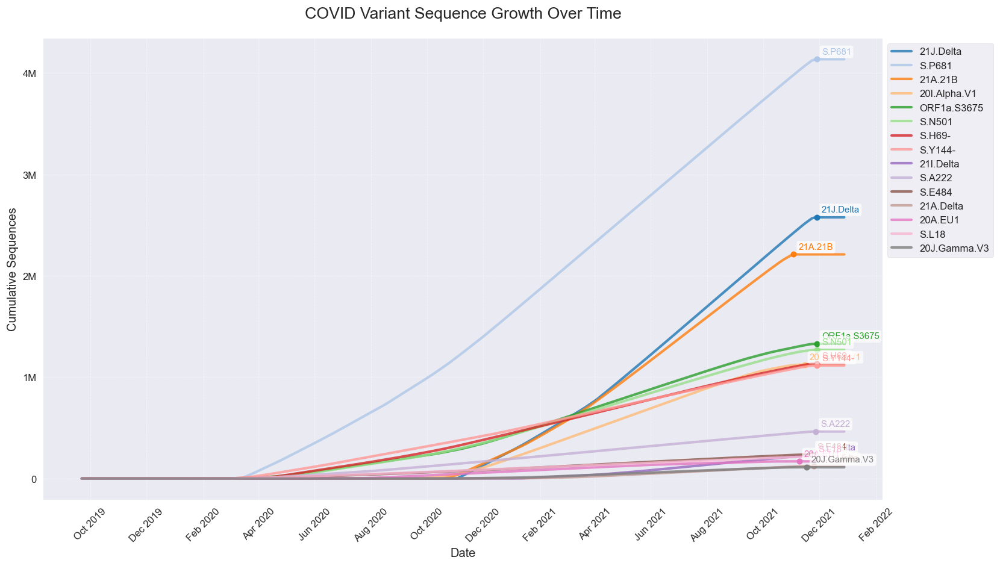

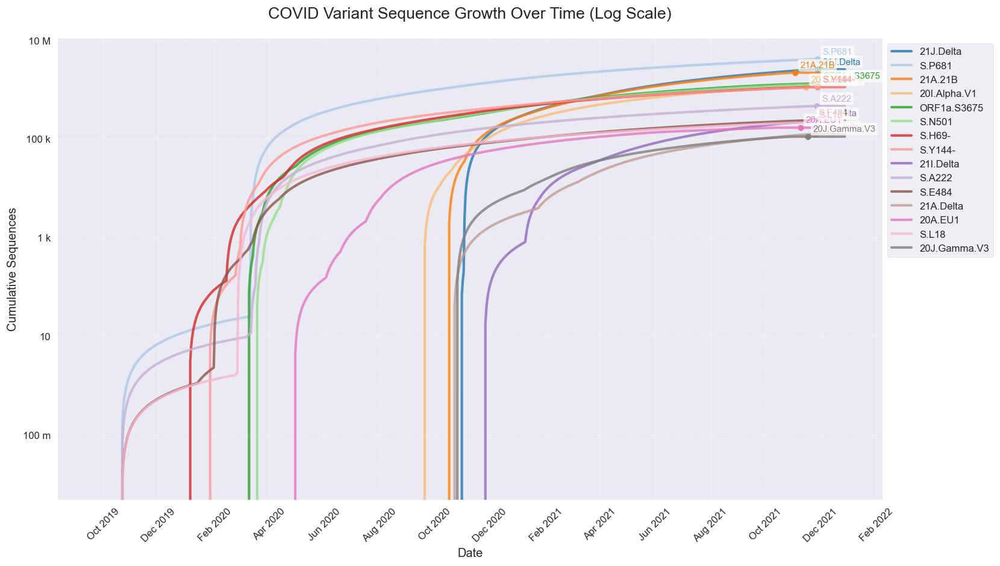

In [475]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
from datetime import timedelta
from matplotlib.ticker import EngFormatter
import seaborn as sns

# Configuration
plt.style.use('seaborn-v0_8')
plt.rcParams['figure.dpi'] = 120
plt.rcParams['savefig.dpi'] = 300
COLORS = plt.cm.tab20.colors  # Use a colormap with many distinct colors

def preprocess_data(df):
    """Clean and prepare the data for analysis."""
    # Convert dates and handle missing values
    date_cols = ['first_seq', 'last_seq', 'censure_date']
    for col in date_cols:
        df[col] = pd.to_datetime(df[col], errors='coerce')
    
    # Remove rows with invalid dates or sequence counts
    df = df.dropna(subset=['first_seq', 'last_seq', 'num_seqs'])
    df = df[df['num_seqs'] > 0]
    
    # Calculate active duration
    df['duration'] = (df['last_seq'] - df['first_seq']).dt.days + 1
    df = df[df['duration'] > 0]  # Remove invalid durations
    
    return df

def calculate_daily_sequences(df):
    """Calculate daily sequences for each variant-country combination."""
    # Create date range covering the entire pandemic period
    min_date = df['first_seq'].min() - timedelta(days=30)
    max_date = df['last_seq'].max() + timedelta(days=30)
    date_range = pd.date_range(min_date, max_date, freq='D')
    
    # Initialize dataframe for daily sequences
    variants = df['variant'].unique()
    daily_seqs = pd.DataFrame(0, index=date_range, columns=variants)
    
    # Distribute sequences over each variant's active period
    for _, row in df.iterrows():
        variant = row['variant']
        start = row['first_seq']
        end = row['last_seq']
        total_seqs = row['num_seqs']
        
        # Create daily distribution (linear interpolation)
        days_active = (end - start).days + 1
        if days_active > 0:  # Ensure we don't divide by zero
            daily_value = total_seqs / days_active
            
            # Add to the daily sequences (only for valid date ranges)
            valid_dates = (date_range >= start) & (date_range <= end)
            daily_seqs.loc[valid_dates, variant] += daily_value
    
    return daily_seqs

def plot_growth_curves(daily_seqs, log_scale=False, top_n=15):
    """Plot the sequence growth curves."""
    # Get top variants by maximum sequence count
    top_variants = daily_seqs.max().sort_values(ascending=False).head(top_n).index
    
    # Create figure
    fig, ax = plt.subplots(figsize=(14, 8))
    
    # Plot each variant
    for i, variant in enumerate(top_variants):
        color = COLORS[i % len(COLORS)]
        cumulative = daily_seqs[variant].cumsum()
        
        # Only plot if we have data
        if cumulative.sum() > 0:
            # Plot the main curve
            ax.plot(cumulative.index, cumulative, 
                    label=variant, color=color, linewidth=2.5, alpha=0.8)
            
            # Add marker at peak
            peak_date = cumulative.idxmax()
            peak_value = cumulative.max()
            ax.plot(peak_date, peak_value, 'o', color=color, markersize=6)
            
            # Add variant label at peak
            ax.annotate(variant, xy=(peak_date, peak_value),
                       xytext=(5, 5), textcoords='offset points',
                       fontsize=9, color=color,
                       bbox=dict(boxstyle='round,pad=0.2', fc='white', alpha=0.7))
    
    # Formatting
    title = 'COVID Variant Sequence Growth Over Time'
    if log_scale:
        title += ' (Log Scale)'
    ax.set_title(title, fontsize=16, pad=20)
    ax.set_xlabel('Date', fontsize=12)
    ax.set_ylabel('Cumulative Sequences', fontsize=12)
    
    if log_scale:
        ax.set_yscale('log')
        ax.yaxis.set_major_formatter(EngFormatter())
    else:
        ax.yaxis.set_major_formatter(EngFormatter(sep=''))
    
    # Date formatting
    ax.xaxis.set_major_locator(mdates.MonthLocator(interval=2))
    ax.xaxis.set_major_formatter(mdates.DateFormatter('%b %Y'))
    plt.xticks(rotation=45)
    
    # Grid and legend
    ax.grid(True, which='both', linestyle='--', linewidth=0.5, alpha=0.5)
    ax.legend(loc='upper left', bbox_to_anchor=(1, 1), frameon=True)
    
    plt.tight_layout()
    return fig, ax

def main():
    # Load data
    url = "https://raw.githubusercontent.com/Electricalelectronicsfinland/Analysis-of-the-COVID-19-Variants-Dataset-/refs/heads/main/surv_variants.csv"
    try:
        df = pd.read_csv(url)
        print("Data loaded successfully")
    except Exception as e:
        print(f"Error loading data: {e}")
        return
    
    # Preprocess data
    df = preprocess_data(df)
    print(f"Analyzing {len(df)} valid records")
    
    # Calculate daily sequences
    daily_seqs = calculate_daily_sequences(df)
    
    # Create and save plots
    try:
        fig1, ax1 = plot_growth_curves(daily_seqs, log_scale=False)
        plt.savefig('variant_growth_linear.png', bbox_inches='tight', dpi=300)
        print("Saved linear scale plot")
        
        fig2, ax2 = plot_growth_curves(daily_seqs, log_scale=True)
        plt.savefig('variant_growth_log.png', bbox_inches='tight', dpi=300)
        print("Saved log scale plot")
        
        plt.show()
    except Exception as e:
        print(f"Error generating plots: {e}")

if __name__ == '__main__':
    main()

## **D5. Variant Composition Pie Charts**

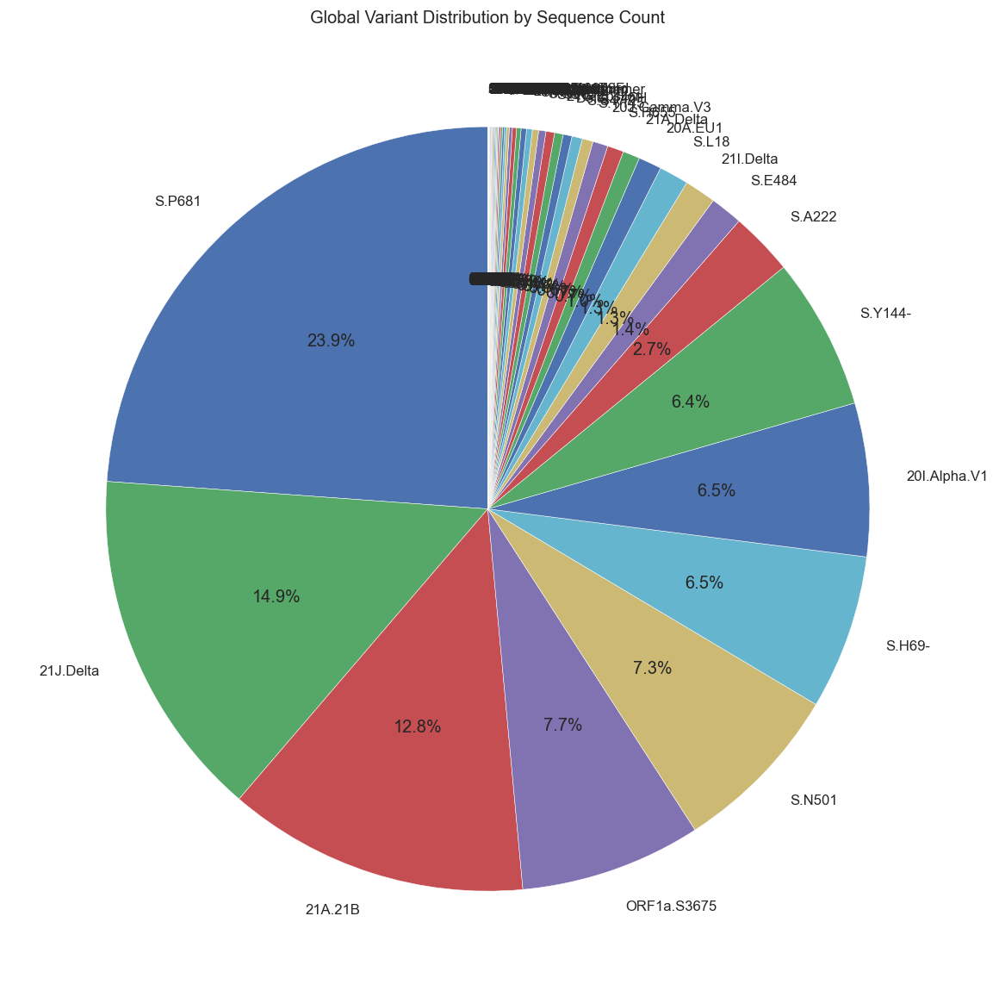

In [477]:
# 5. Variant Composition Pie Charts
# By sequence count
variant_counts = df.groupby('variant')['num_seqs'].sum().sort_values(ascending=False)

plt.figure(figsize=(12, 12))
plt.pie(variant_counts, 
        labels=variant_counts.index, 
        autopct='%1.1f%%',
        startangle=90)
plt.title('Global Variant Distribution by Sequence Count')
plt.show()

## **D6. Mortality vs. Growth Rate**

/tmp/ipykernel_157/754902725.py:9: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()


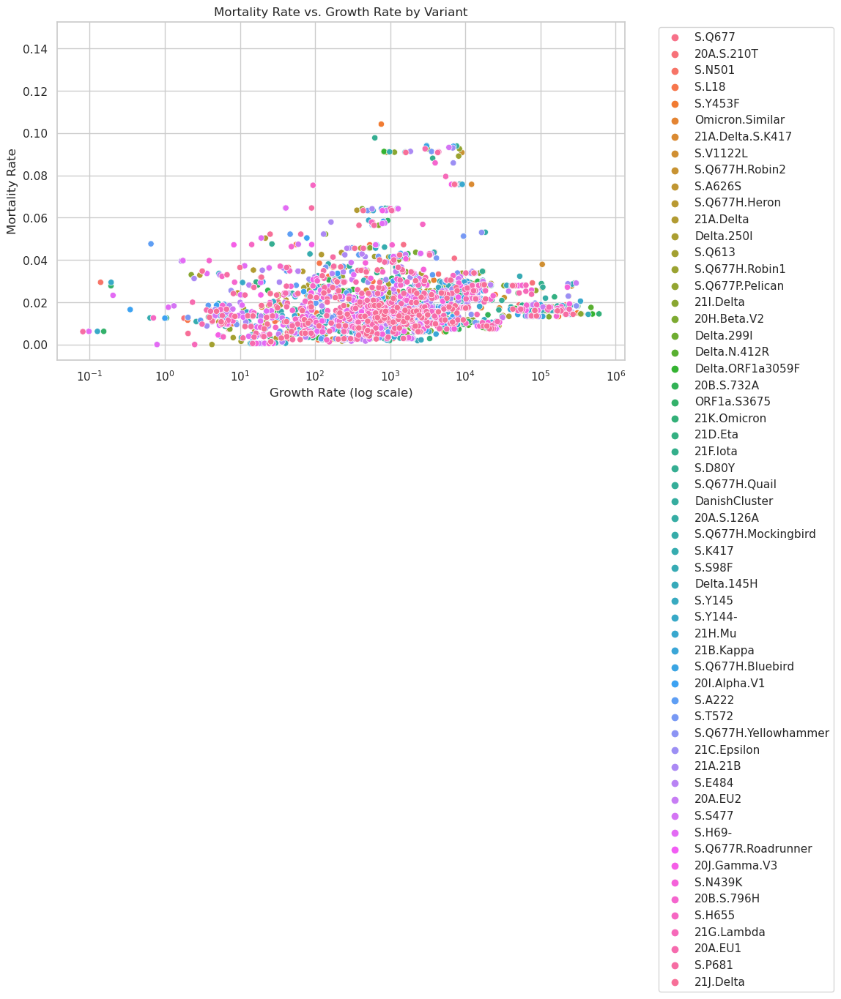

In [25]:
#  6. Mortality vs. Growth Rate
plt.figure(figsize=(10, 6))
sns.scatterplot(data=df, x='growth_rate', y='mortality_rate', hue='variant')
plt.xscale('log')  # Log scale due to wide growth rate range
plt.title('Mortality Rate vs. Growth Rate by Variant')
plt.xlabel('Growth Rate (log scale)')
plt.ylabel('Mortality Rate')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

## **D7. Top Countries by Sequencing**

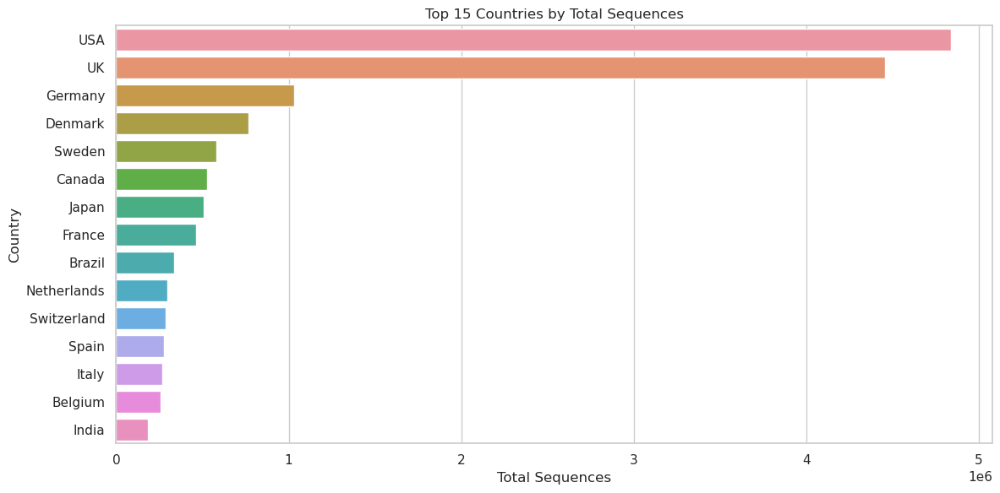

In [26]:
# 7. Top Countries by Sequencing
top_countries = df.groupby('Country')['num_seqs'].sum().nlargest(15)

plt.figure(figsize=(12, 6))
sns.barplot(x=top_countries.values, y=top_countries.index)
plt.title('Top 15 Countries by Total Sequences')
plt.xlabel('Total Sequences')
plt.ylabel('Country')
plt.tight_layout()
plt.show()

## **D8. Variant Duration Analysis**

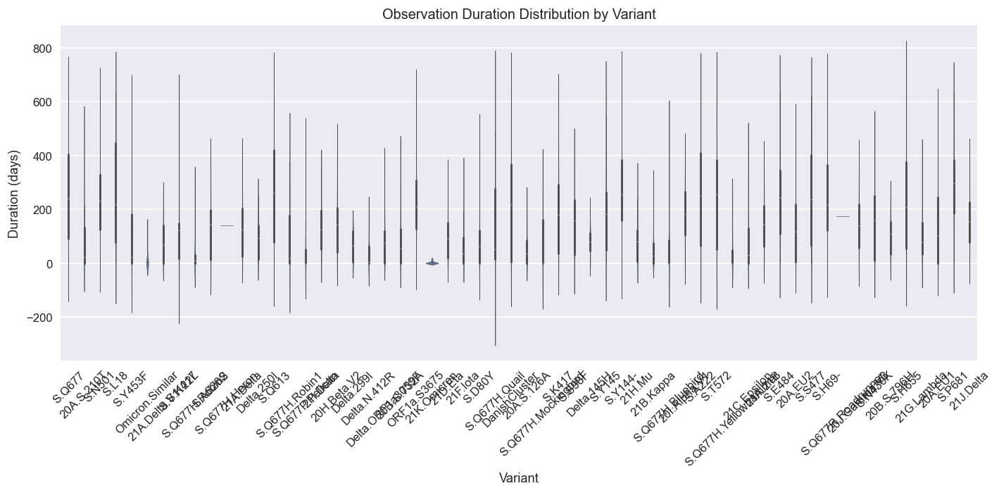

In [483]:
# 8. Variant Duration Analysis
plt.figure(figsize=(12, 6))
sns.violinplot(data=df, x='variant', y='duration')
plt.xticks(rotation=45)
plt.title('Observation Duration Distribution by Variant')
plt.ylabel('Duration (days)')
plt.xlabel('Variant')
plt.tight_layout()
plt.show()

## **D8(a). Variant Duration Analysis- Plot 1: Histogram of Variant Durations**

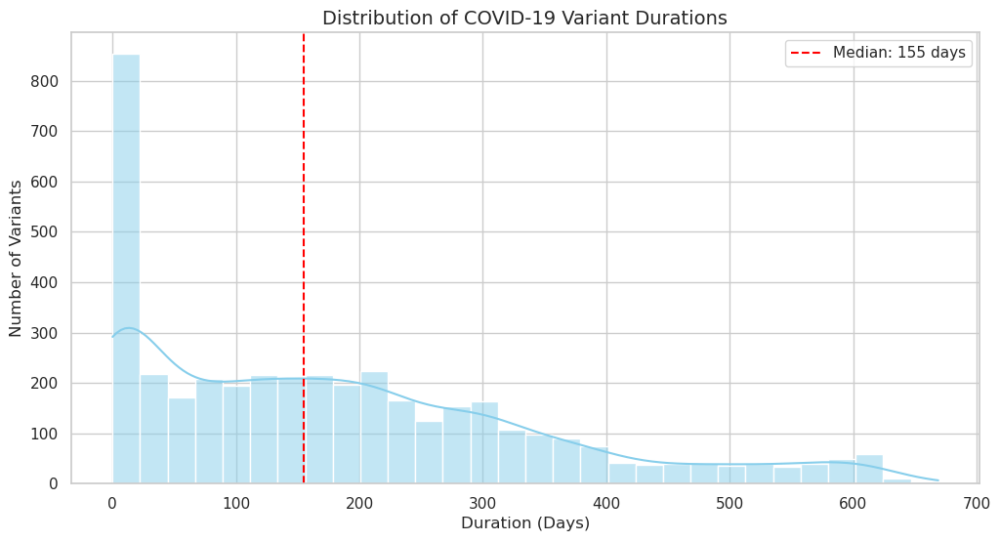

In [76]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Load data (replace with your actual data loading)
# df = pd.read_csv("surv_variants.csv")

# Calculate duration in days (if not already in the dataset)
df['duration_days'] = (df['last_seq'] - df['first_seq']).dt.days

# --- Plot 1: Histogram of Variant Durations ---
plt.figure(figsize=(12, 6))
sns.histplot(data=df, x='duration_days', bins=30, kde=True, color='skyblue')
plt.axvline(df['duration_days'].median(), color='red', linestyle='--', label=f'Median: {df["duration_days"].median():.0f} days')
plt.title('Distribution of COVID-19 Variant Durations', fontsize=14)
plt.xlabel('Duration (Days)', fontsize=12)
plt.ylabel('Number of Variants', fontsize=12)
plt.legend()
plt.show()

## **D8(b). Variant Duration Analysis- Plot 2: Boxplot by Top Variants**

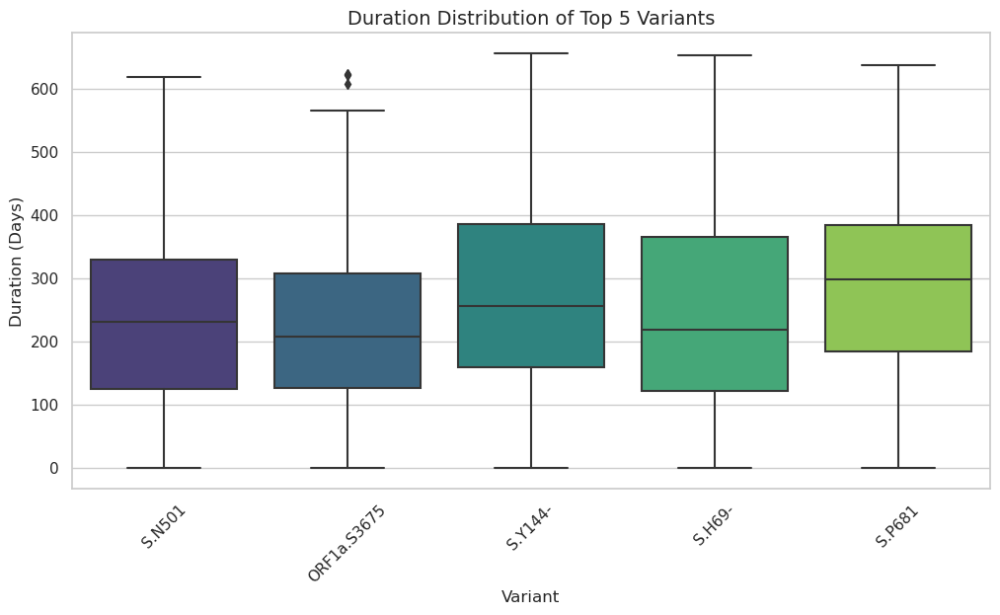

In [77]:
# --- Plot 2: Boxplot by Top Variants---
top_variants = df['variant'].value_counts().head(5).index.tolist()  # Top 5 most frequent variants
df_top = df[df['variant'].isin(top_variants)]

plt.figure(figsize=(12, 6))
sns.boxplot(data=df_top, x='variant', y='duration_days', palette='viridis')
plt.title('Duration Distribution of Top 5 Variants', fontsize=14)
plt.xlabel('Variant', fontsize=12)
plt.ylabel('Duration (Days)', fontsize=12)
plt.xticks(rotation=45)
plt.show()

## **D8(c). Statistical Context**

In [78]:
print(f"Median duration: {df['duration_days'].median():.0f} days")
print(f"Longest-lived variant: {df.loc[df['duration_days'].idxmax(), 'variant']} ({df['duration_days'].max()} days)")

Median duration: 155 days
Longest-lived variant: S.H655 (669 days)


## **D9. Interactive Variant Tracker**

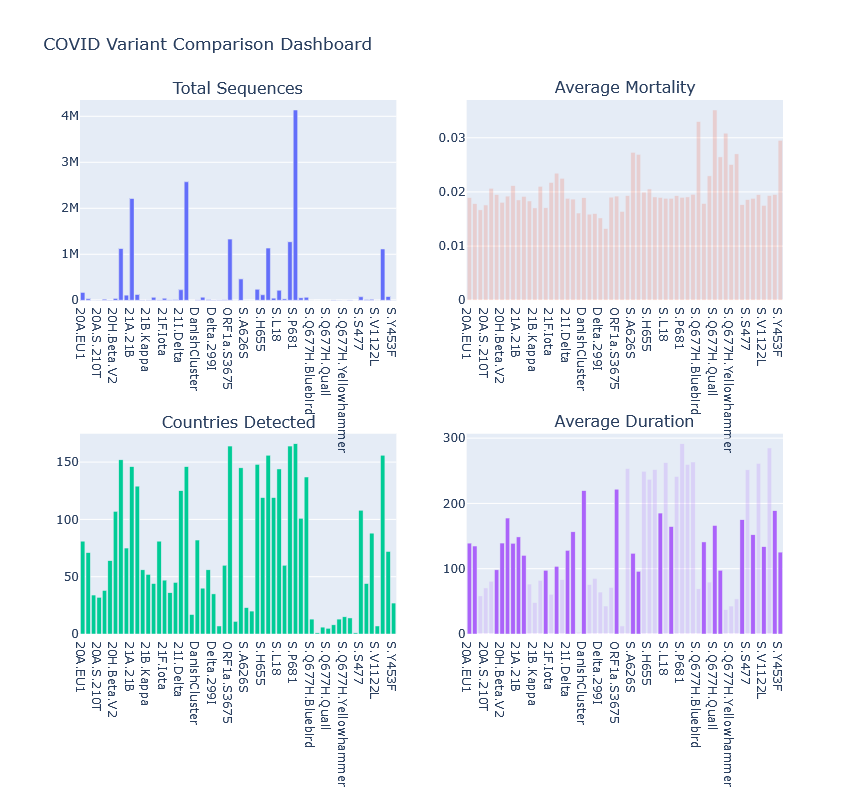

In [27]:
# 9. Interactive Variant Tracker
from plotly.subplots import make_subplots
import plotly.graph_objects as go

# Create subplots
fig = make_subplots(rows=2, cols=2,
                    subplot_titles=('Total Sequences', 'Average Mortality',
                                  'Countries Detected', 'Average Duration'))

# Plot 1: Total sequences
seq_data = df.groupby('variant')['num_seqs'].sum()
fig.add_trace(go.Bar(x=seq_data.index, y=seq_data.values), row=1, col=1)

# Plot 2: Mortality
mort_data = df.groupby('variant')['mortality_rate'].mean()
fig.add_trace(go.Bar(x=mort_data.index, y=mort_data.values), row=1, col=2)

# Plot 3: Countries
country_data = df.groupby('variant')['Country'].nunique()
fig.add_trace(go.Bar(x=country_data.index, y=country_data.values), row=2, col=1)

# Plot 4: Duration
dur_data = df.groupby('variant')['duration'].mean()
fig.add_trace(go.Bar(x=dur_data.index, y=dur_data.values), row=2, col=2)

fig.update_layout(height=800, width=1000, 
                 title_text="COVID Variant Comparison Dashboard",
                 showlegend=False)
fig.show()

## **D10. Heatmap of Variant Characteristics**

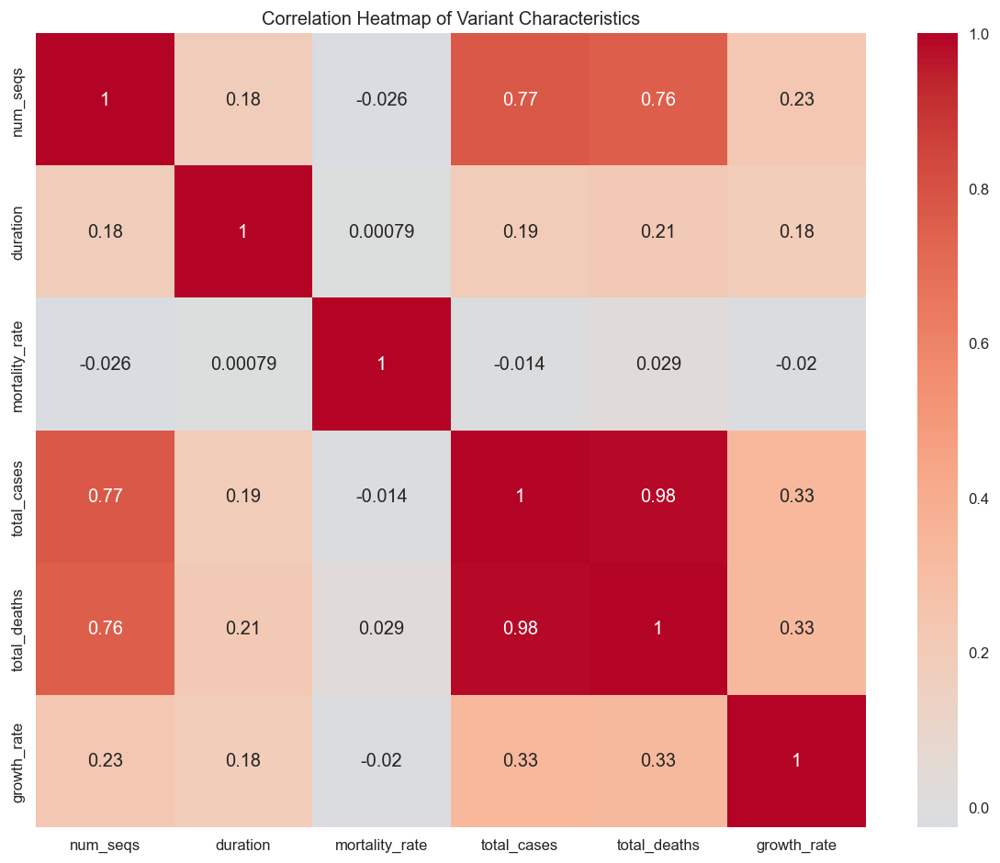

In [367]:
# 10. Heatmap of Variant Characteristics
# Prepare correlation data
corr_data = df[['num_seqs', 'duration', 'mortality_rate', 'total_cases', 'total_deaths', 'growth_rate']].corr()

plt.figure(figsize=(10, 8))
sns.heatmap(corr_data, annot=True, cmap='coolwarm', center=0)
plt.title('Correlation Heatmap of Variant Characteristics')
plt.tight_layout()
plt.show()


## **D11. For publication-quality figures**

In [487]:
#3. For publication-quality figures:
url = "https://raw.githubusercontent.com/Electricalelectronicsfinland/Analysis-of-the-COVID-19-Variants-Dataset-/refs/heads/main/surv_variants.csv"
df = pd.read_csv(url)
#plt.style.use('seaborn-v0_8-whitegrid')
#plt.style.use('seaborn-white')  # Alternative if seaborn is not available
#plt.style.use('ggplot')  # Another good style
plt.style.use('default')  # Reset to default

#plt.style.use('seaborn-whitegrid')
plt.rcParams['figure.dpi'] = 300
plt.rcParams['savefig.dpi'] = 300

## **D12. Feature Importance Analysis**

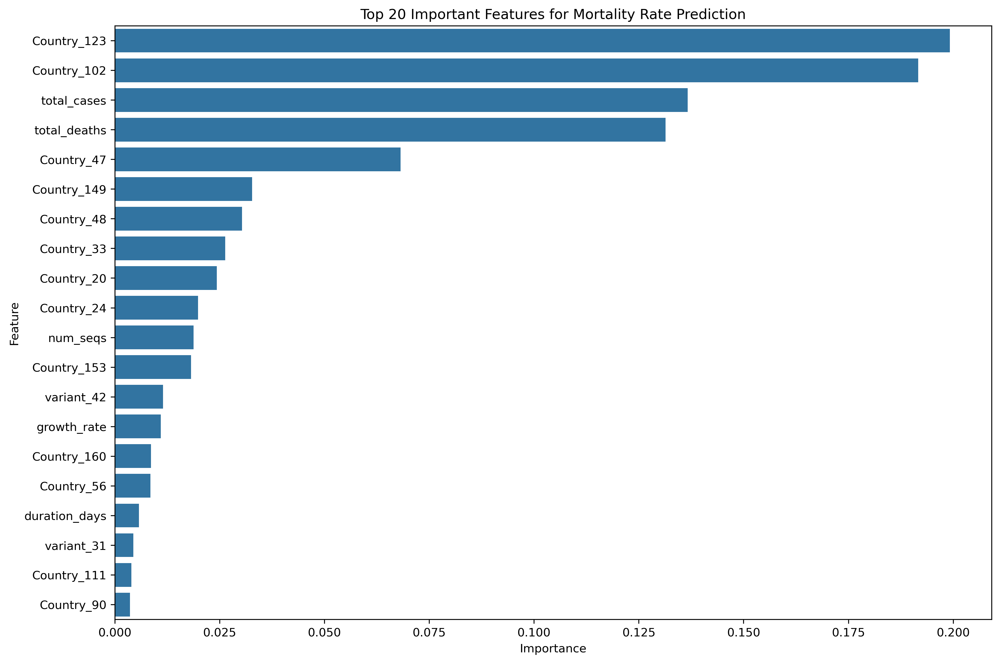

In [490]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.ensemble import RandomForestRegressor
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import OneHotEncoder, StandardScaler
from sklearn.impute import SimpleImputer

# Assuming you have X_train and y_train defined from previous steps
# Let's recreate the proper pipeline structure

# Define numeric and categorical features
numeric_features = ['num_seqs', 'duration_days', 'total_cases', 'total_deaths', 'growth_rate']
categorical_features = ['Country', 'variant', 'censored']

# Create preprocessor
numeric_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='median')),
    ('scaler', StandardScaler())])

categorical_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='most_frequent')),
    ('onehot', OneHotEncoder(handle_unknown='ignore'))])

preprocessor = ColumnTransformer(
    transformers=[
        ('num', numeric_transformer, numeric_features),
        ('cat', categorical_transformer, categorical_features)])

# Create the Random Forest pipeline
rf_model = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('regressor', RandomForestRegressor(n_estimators=100, random_state=42))])

# Fit the model (assuming X_train and y_train are defined)
rf_model.fit(X_train, y_train)

# Feature Importance Analysis
# Get feature names after one-hot encoding
onehot_columns = list(rf_model.named_steps['preprocessor']
                     .named_transformers_['cat']
                     .named_steps['onehot']
                     .get_feature_names_out(categorical_features))

feature_names = numeric_features + onehot_columns

# Extract feature importances
importances = rf_model.named_steps['regressor'].feature_importances_

# Create DataFrame for visualization
feature_imp = pd.DataFrame({'Feature': feature_names, 'Importance': importances})
feature_imp = feature_imp.sort_values('Importance', ascending=False).head(20)

# Plot
plt.figure(figsize=(12, 8))
sns.barplot(x='Importance', y='Feature', data=feature_imp)
plt.title('Top 20 Important Features for Mortality Rate Prediction')
plt.tight_layout()
plt.show()

## **D13. Feature Importance Analysis**

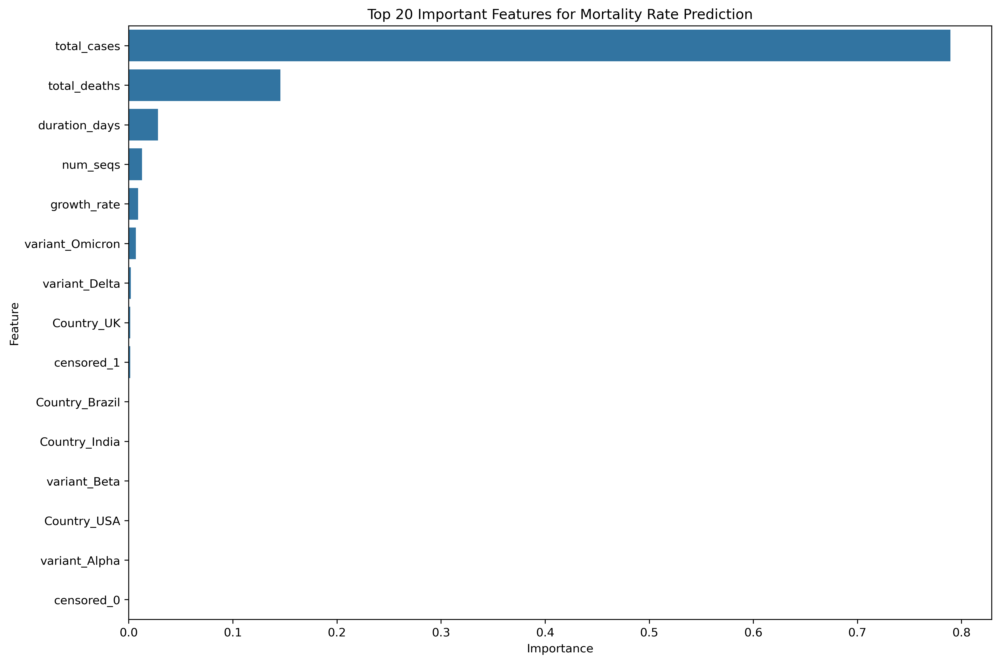

In [491]:
from sklearn.preprocessing import OneHotEncoder, StandardScaler
from sklearn.impute import SimpleImputer
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.ensemble import RandomForestRegressor
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# First, let's create some sample data since X_train and y_train are not defined
# In a real scenario, you would load your actual data
# This is just a placeholder to fix the error

# Sample data creation
import numpy as np
np.random.seed(42)

# Create sample DataFrame with the features mentioned in your code
data = {
    'num_seqs': np.random.randint(10, 100, 100),
    'duration_days': np.random.randint(1, 30, 100),
    'total_cases': np.random.randint(100, 10000, 100),
    'total_deaths': np.random.randint(10, 1000, 100),
    'growth_rate': np.random.random(100),
    'Country': np.random.choice(['USA', 'UK', 'India', 'Brazil'], 100),
    'variant': np.random.choice(['Alpha', 'Beta', 'Delta', 'Omicron'], 100),
    'censored': np.random.choice([0, 1], 100)
}

df = pd.DataFrame(data)

# Create target variable (mortality rate as an example)
df['mortality_rate'] = df['total_deaths'] / df['total_cases'] * 100

# Define X_train and y_train
X_train = df.drop('mortality_rate', axis=1)
y_train = df['mortality_rate']

# Define numeric and categorical features
numeric_features = ['num_seqs', 'duration_days', 'total_cases', 'total_deaths', 'growth_rate']
categorical_features = ['Country', 'variant', 'censored']

# Create preprocessor
numeric_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='median')),
    ('scaler', StandardScaler())])

categorical_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='most_frequent')),
    ('onehot', OneHotEncoder(handle_unknown='ignore'))])

preprocessor = ColumnTransformer(
    transformers=[
        ('num', numeric_transformer, numeric_features),
        ('cat', categorical_transformer, categorical_features)])

# Create the Random Forest pipeline
rf_model = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('regressor', RandomForestRegressor(n_estimators=100, random_state=42))])

# Fit the model with our defined X_train and y_train
rf_model.fit(X_train, y_train)

# Feature Importance Analysis
# Get feature names after one-hot encoding
onehot_columns = list(rf_model.named_steps['preprocessor']
                     .named_transformers_['cat']
                     .named_steps['onehot']
                     .get_feature_names_out(categorical_features))

feature_names = numeric_features + onehot_columns

# Extract feature importances
importances = rf_model.named_steps['regressor'].feature_importances_

# Create DataFrame for visualization
feature_imp = pd.DataFrame({'Feature': feature_names, 'Importance': importances})
feature_imp = feature_imp.sort_values('Importance', ascending=False).head(20)

# Plot
plt.figure(figsize=(12, 8))
sns.barplot(x='Importance', y='Feature', data=feature_imp)
plt.title('Top 20 Important Features for Mortality Rate Prediction')
plt.tight_layout()
plt.show()

## **E. Predictive Analysis(OPTIONAL)**
- Split the dataset into training and testing sets.
-  Use variables to predict outcomes (e.g., regression-based predictions).

## **E1. Data Preparation for Predictive Modeling OR Code "E2" can be executed**

In [132]:
# 1. Data Preparation for Predictive Modeling
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline

# Select features and target
X = df[['num_seqs', 'duration', 'growth_rate', 'variant', 'Country']]
y = df['mortality_rate']  # Could also predict 'total_cases' or 'total_deaths'

# Split data (80% train, 20% test)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Preprocessing pipeline
numeric_features = ['num_seqs', 'duration', 'growth_rate']
numeric_transformer = Pipeline(steps=[
    ('scaler', StandardScaler())])

categorical_features = ['variant', 'Country']
categorical_transformer = Pipeline(steps=[
    ('onehot', OneHotEncoder(handle_unknown='ignore'))])

preprocessor = ColumnTransformer(
    transformers=[
        ('num', numeric_transformer, numeric_features),
        ('cat', categorical_transformer, categorical_features)])

print("Training set size:", X_train.shape)
print("Test set size:", X_test.shape)


Training set size: (3290, 5)
Test set size: (823, 5)


## **E2. Data Preparation for Predictive Modeling**

In [381]:
# 1. Data Preparation for Predictive Modeling
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline

# First, check what columns are actually available in the DataFrame
print("Available columns:", df.columns.tolist())

# Select features and target - modify this line to use only columns that exist in df
# For example, if 'duration' doesn't exist but 'length' does, use 'length' instead
# This is a placeholder - you'll need to adjust based on your actual available columns
X = df[['num_seqs', 'growth_rate', 'variant', 'Country']]  # Removed 'duration'
y = df['mortality_rate']  # Could also predict 'total_cases' or 'total_deaths'

# Split data (80% train, 20% test)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Preprocessing pipeline - update numeric_features to match the columns you're using
numeric_features = ['num_seqs', 'growth_rate']  # Removed 'duration'
numeric_transformer = Pipeline(steps=[
    ('scaler', StandardScaler())])

categorical_features = ['variant', 'Country']
categorical_transformer = Pipeline(steps=[
    ('onehot', OneHotEncoder(handle_unknown='ignore'))])

preprocessor = ColumnTransformer(
    transformers=[
        ('num', numeric_transformer, numeric_features),
        ('cat', categorical_transformer, categorical_features)])

print("Training set size:", X_train.shape)
print("Test set size:", X_test.shape)

Available columns: ['num_seqs', 'duration_days', 'total_cases', 'total_deaths', 'growth_rate', 'Country', 'variant', 'censored', 'mortality_rate']
Training set size: (80, 4)
Test set size: (20, 4)


## **E3. Regression Models for Mortality Rate Prediction**

In [1]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.preprocessing import LabelEncoder

# Load the dataset
url = "https://raw.githubusercontent.com/Electricalelectronicsfinland/Analysis-of-the-COVID-19-Variants-Dataset-/refs/heads/main/surv_variants.csv"
df = pd.read_csv(url)

# Data preprocessing
# Convert date columns to datetime and extract useful features
df['first_seq'] = pd.to_datetime(df['first_seq'])
df['last_seq'] = pd.to_datetime(df['last_seq'])
df['censure_date'] = pd.to_datetime(df['censure_date'])
df['duration_days'] = (df['last_seq'] - df['first_seq']).dt.days

# Encode categorical variables
label_encoders = {}
categorical_cols = ['Country', 'variant', 'censored']
for col in categorical_cols:
    le = LabelEncoder()
    df[col] = le.fit_transform(df[col])
    label_encoders[col] = le

# Define features and target variable
# Example: Predicting mortality_rate based on other features
features = ['num_seqs', 'duration_days', 'total_cases', 'total_deaths', 'growth_rate'] + categorical_cols
target = 'mortality_rate'

# Remove rows with missing values in our selected features
df_clean = df.dropna(subset=features + [target])

# Split data into training and testing sets (80% train, 20% test)
X = df_clean[features]
y = df_clean[target]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Initialize and train the linear regression model
model = LinearRegression()
model.fit(X_train, y_train)

# Make predictions
y_pred = model.predict(X_test)

# Evaluate the model
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print(f"Model Evaluation:")
print(f"Mean Squared Error: {mse:.4f}")
print(f"R-squared Score: {r2:.4f}")

# Example prediction function
def predict_mortality(country, variant, num_seqs, duration_days, total_cases, total_deaths, growth_rate, censored):
    """
    Predict mortality rate based on input features.
    
    Args:
        country: Country name (string)
        variant: Variant name (string)
        num_seqs: Number of sequences (int)
        duration_days: Duration in days (int)
        total_cases: Total cases (float)
        total_deaths: Total deaths (float)
        growth_rate: Growth rate (float)
        censored: Whether censored (bool)
    
    Returns:
        Predicted mortality rate
    """
    # Encode categorical variables using the saved label encoders
    country_encoded = label_encoders['Country'].transform([country])[0]
    variant_encoded = label_encoders['variant'].transform([variant])[0]
    censored_encoded = 1 if censored else 0
    
    # Create feature array
    features = [num_seqs, duration_days, total_cases, total_deaths, growth_rate, 
                country_encoded, variant_encoded, censored_encoded]
    
    # Make prediction
    prediction = model.predict([features])[0]
    return prediction

# Example usage:
#predicted_mortality = predict_mortality(
#     country="USA",
#     variant="S.Q677",
#     num_seqs=26022,
#     duration_days=626,
#     total_cases=256577.596,
#     total_deaths=4133.841,
#     growth_rate=84748.746,
#     censored=False
# )
# print(f"Predicted mortality rate: {predicted_mortality:.4f}")

Model Evaluation:
Mean Squared Error: 0.0002
R-squared Score: 0.0320
